## Telecom Churn Group Case Study

#### Problem Statement

Customers in the telecom sector have the ability to actively move between different operators and select from a variety of service providers. The annual churn rate in the telecommunications sector is between 15 and 25 percent on average in this fiercely competitive market. Customer retention has surpassed customer acquisition in importance since it is now five to ten times more expensive to keep an existing customer than to acquire a new one.

Retaining highly profitable clients is the top priority for many established operators.

Telecom firms need to identify which customers are most likely to leave in order to minimize customer attrition. 
In this assignment, you will examine customer-level df from a top telecom company, develop predictive models to pinpoint high-risk clients, and pinpoint the primary churn indicators.

Consumer actions during a churn:

Consumers typically decide to move to a rival over time rather than all at once (this is especially pertinent to high-value customers).
We make the following assumptions about the customer lifecycle phases when predicting churn:

1) The "good" phase: During this time, the client is satisfied with the assistance and acts normally.

2) The "action" phase is when the customer's experience starts to go south. For example, he or she receives an alluring offer from
   a rival, is subjected to unfair charges, is dissatisfied with the caliber of the service, etc. 
   The client typically behaves differently during this time than during the "good" months.
   Since remedial action (e.g., matching the competitor's offer, enhancing service quality, etc.) can be performed at this time, it
   is imperative to identify high-churn-risk clients during this phase.

4) The ‘churn’ phase: In this phase, the customer is said to have churned. 
    
   In this instance, because we are working over a four-month period, the "good" phase occurs in the first two months (June and
   July), the "action" phase occurs in the third month (August), and the "churn" phase occurs in the fourth month (September).).urn’ phase.

#### Goal:

Building machine learning models to forecast clients who will leave based on the features made available for their use is the primary objective of the case study. 

1) The purpose of the model is to forecast the likelihood of a high-value client leaving in the near future (also known as the churn phase). 
Knowing this allows the business to take appropriate action, like offering exclusive programs or low-cost recharges.

2) It will be applied to determine significant variables that have high churn prediction power. These factors might also reveal the reasons behind users' decisions to move to different networks.

The main assessment metric that we will use is overall accuracy; however, depending on various business objectives, we will also compute other metrics for the various models that can be utilized for evaluation, such as precision and recall. 

One of the main goals of this machine learning model is to more accurately identify consumers who are likely to churn than those who are not. As a result, we will use "Sensitivity" (also known as "Recall") as a crucial statistic to compare all of the models.ls.s

#### Methods:

If performing PCA for dimensionality reduction aids in a commensurate improvement in the ensuing accuracy levels as well, we will use it to forecast clients who are likely to leave.
Nevertheless, as PCA is unable to assist in the interpretation of the crucial churn factors, we will construct two models to handle goals 1) and 2) independently. 

#### Important Assumption:

Given that the training dataset only includes three months and the issue description from Kaggle mentions four months, we infer that September, the month of the churn phase, has already been deleted from the dataset. 

As a result, we do not eliminate any columns from our analysis based on the churn phase.  

### Steps:
- Data Interpretation 
- Data Purification (Error-prone df imputation)
- EDA (Heatmaps -> Bivariate -> Univariate)
- PCA Feature Selectring
- Feature Selection (PCA)
- Model Development with PCA (To predict churn) i.e. Logistic Regres si on->Decision  Tr ee->Random Forest ->GDB- > XGB -> Catb -> ...st..SVM
- Model Evaluation  (Sensitivity,Precision,accuracy,AOC)
- Two Final Models (two different approaches)
- Model Development without PCA (To identify important features)


In [1]:
import numpy as np  # Import NumPy library for numerical computations
import pandas as pd  # Import Pandas library for data manipulation and analysis
import warnings  # Import Warnings library to suppress warning messages
import matplotlib.pyplot as plt  # Import Matplotlib library for data visualization
import seaborn as sns  # Import Seaborn library for statistical data visualization
warnings.filterwarnings('ignore')  # Ignore warning messages during execution

In [2]:
#opening the df:
# Read the 'train.csv' file into a DataFrame using pandas.
df = pd.read_csv('train.csv')

# Print concise summary of the DataFrame including df types and memory usage.
# The verbose parameter is set to 1 to provide detailed information about the DataFrame.
df.info(verbose = 1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [3]:
# Calculating the percentage of missing df for each column in the dataframe 'df' and creating a dictionary with column names as keys and their corresponding missing df percentages as values.
missing_df_percentage = dict(df.isna().sum() / len(df) * 100)
missing_df_percentage

{'id': 0.0,
 'circle_id': 0.0,
 'loc_og_t2o_mou': 1.0028714695924228,
 'std_og_t2o_mou': 1.0028714695924228,
 'loc_ic_t2o_mou': 1.0028714695924228,
 'last_date_of_month_6': 0.0,
 'last_date_of_month_7': 0.570008142973471,
 'last_date_of_month_8': 1.0471578165402362,
 'arpu_6': 0.0,
 'arpu_7': 0.0,
 'arpu_8': 0.0,
 'onnet_mou_6': 3.954342204888641,
 'onnet_mou_7': 3.8386262660895154,
 'onnet_mou_8': 5.2900755725081785,
 'offnet_mou_6': 3.954342204888641,
 'offnet_mou_7': 3.8386262660895154,
 'offnet_mou_8': 5.2900755725081785,
 'roam_ic_mou_6': 3.954342204888641,
 'roam_ic_mou_7': 3.8386262660895154,
 'roam_ic_mou_8': 5.2900755725081785,
 'roam_og_mou_6': 3.954342204888641,
 'roam_og_mou_7': 3.8386262660895154,
 'roam_og_mou_8': 5.2900755725081785,
 'loc_og_t2t_mou_6': 3.954342204888641,
 'loc_og_t2t_mou_7': 3.8386262660895154,
 'loc_og_t2t_mou_8': 5.2900755725081785,
 'loc_og_t2m_mou_6': 3.954342204888641,
 'loc_og_t2m_mou_7': 3.8386262660895154,
 'loc_og_t2m_mou_8': 5.2900755725081785

In [4]:
# This line of code generates descriptive statistics of a DataFrame using the describe() method,
# with additional percentiles specified as a list: 25th, 50th (median), 75th, 90th, 95th, and 99th percentiles.
# This allows for a more detailed understanding of the distribution of numerical data in the DataFrame.
df.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,...,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000
mean,34999.000000,109.0,0.0,0.0,0.0,283.134365,278.185912,278.858826,133.153275,133.894438,...,0.081444,0.085487,0.916325,0.909544,0.890319,1220.639709,68.108597,65.935830,60.07674,0.101887
std,20207.115084,0.0,0.0,0.0,0.0,334.213918,344.366927,351.924315,299.963093,311.277193,...,0.634547,0.680035,0.276907,0.286842,0.312501,952.426321,269.328659,267.899034,257.22681,0.302502
min,0.000000,109.0,0.0,0.0,0.0,-2258.709000,-1289.715000,-945.808000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.00000,0.000000
25%,17499.500000,109.0,0.0,0.0,0.0,93.581000,86.714000,84.095000,7.410000,6.675000,...,0.000000,0.000000,1.000000,1.000000,1.000000,468.000000,0.000000,0.000000,0.00000,0.000000
50%,34999.000000,109.0,0.0,0.0,0.0,197.484000,191.588000,192.234000,34.110000,32.280000,...,0.000000,0.000000,1.000000,1.000000,1.000000,868.000000,0.000000,0.000000,0.00000,0.000000
75%,52498.500000,109.0,0.0,0.0,0.0,370.791000,365.369500,369.909000,119.390000,115.837500,...,0.000000,0.000000,1.000000,1.000000,1.000000,1813.000000,0.000000,0.000000,0.00000,0.000000
90%,62998.200000,109.0,0.0,0.0,0.0,619.993800,615.661400,614.994600,345.080000,347.908000,...,0.000000,0.000000,1.000000,1.000000,1.000000,2792.000000,160.444000,136.272000,110.32800,1.000000
95%,66498.100000,109.0,0.0,0.0,0.0,832.022700,823.236700,828.464700,617.185000,628.437500,...,0.000000,0.000000,1.000000,1.000000,1.000000,3108.000000,464.277000,446.353000,400.13400,1.000000
99%,69298.020000,109.0,0.0,0.0,0.0,1400.276640,1414.891380,1445.054800,1447.098000,1478.540900,...,2.000000,2.000000,1.000000,1.000000,1.000000,3651.000000,1226.659800,1254.279000,1188.26780,1.000000


### Data Interpretation - Understanding and Cleansing

In [5]:
# Importing SimpleImputer from the scikit-learn library for data imputation
from sklearn.impute import SimpleImputer

In [6]:
# Count the number of columns for each data type in the DataFrame 'df'
df.dtypes.value_counts()

float64    135
int64       28
object       9
Name: count, dtype: int64

In [7]:
# Creating a list 'num_variables' containing column names for non-object (numerical) data types in the DataFrame 'df'
num_variables=[col for col in df.columns if df[col].dtype!='O']
num_variables

['id',
 'circle_id',
 'loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og

### Imputing the recharge columns:


In [8]:
# Creating a list 'recharge_cols' containing column names with 'rech' in their names and are of numerical data type
recharge_cols = [col for col in df.columns if 'rech' in col and col in num_variables]

# Initializing SimpleImputer to replace missing values with constant (0) for columns in 'recharge_cols'
imputer = SimpleImputer(strategy='constant', fill_value=0)

# Imputing missing values in 'recharge_cols' using the imputer
df[recharge_cols] = imputer.fit_transform(df[recharge_cols])

# Calculating the percentage of missing values in columns of 'recharge_cols' after imputation
df[recharge_cols].isna().sum() * 100 / len(df)

total_rech_num_6      0.0
total_rech_num_7      0.0
total_rech_num_8      0.0
total_rech_amt_6      0.0
total_rech_amt_7      0.0
total_rech_amt_8      0.0
max_rech_amt_6        0.0
max_rech_amt_7        0.0
max_rech_amt_8        0.0
total_rech_data_6     0.0
total_rech_data_7     0.0
total_rech_data_8     0.0
max_rech_data_6       0.0
max_rech_data_7       0.0
max_rech_data_8       0.0
count_rech_2g_6       0.0
count_rech_2g_7       0.0
count_rech_2g_8       0.0
count_rech_3g_6       0.0
count_rech_3g_7       0.0
count_rech_3g_8       0.0
av_rech_amt_data_6    0.0
av_rech_amt_data_7    0.0
av_rech_amt_data_8    0.0
dtype: float64

### Imputing the flag columns:

In [9]:
# Specifying columns 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7', 'fb_user_8' 
# as flag columns, which are currently classified as numerical, hence imputing them with 0.
flag_cols = ['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7', 'fb_user_8']

# Imputing missing values in 'flag_cols' with 0 using the previously initialized imputer
df[flag_cols] = imputer.fit_transform(df[flag_cols])

# Calculating the percentage of missing values in columns of 'flag_cols' after imputation
df[flag_cols].isna().sum() * 100 / len(df)

night_pck_user_6    0.0
night_pck_user_7    0.0
night_pck_user_8    0.0
fb_user_6           0.0
fb_user_7           0.0
fb_user_8           0.0
dtype: float64

In [10]:
# Creating a DataFrame 'isna_data' to analyze missing values in DataFrame 'df'
isna_data = pd.DataFrame(df.isna().sum() / len(df) * 100)

# Sorting 'isna_data' by percentage of missing values in descending order
isna_data = isna_data.sort_values(by=0, ascending=False)

# Resetting index of 'isna_data'
isna_data = isna_data.reset_index()

# Renaming columns of 'isna_data' as 'feature' and 'percentage'
isna_data.columns = ['feature', 'percentage']

# Displaying the DataFrame 'isna_data' with information about missing values
isna_data

,feature,percentage
0,arpu_3g_6,74.902499
1,arpu_2g_6,74.902499
2,date_of_last_rech_data_6,74.902499
3,arpu_3g_7,74.478207
4,arpu_2g_7,74.478207
...,...,...
167,last_day_rch_amt_8,0.000000
168,last_day_rch_amt_7,0.000000
169,last_day_rch_amt_6,0.000000
170,max_rech_amt_8,0.000000


### Dropping the columns having too much missing df and less relevance:

In [11]:
# Filtering columns from 'isna_data' where the percentage of missing values is less than 30%
relevent_columns_data = isna_data[isna_data['percentage'] < 30]

# Displaying the DataFrame 'relevent_columns_data' with columns having missing values less than 30%
relevent_columns_data

# Extracting the list of relevant columns from 'relevent_columns_data'
imp_columns = list(relevent_columns_data['feature'])

# Creating a refined DataFrame 'df_refined_1' containing only the relevant columns
df_refined_1 = df[imp_columns]

# Creating a DataFrame to show the percentage of missing values in the refined data
pd.DataFrame(df_refined_1.isna().sum() / len(df) * 100).shape

(163, 1)

### Handling the date variables:

In [12]:
# Creating a list 'df_variables' containing column names for variables with object (string) data type in the DataFrame 'df_refined_1'
df_variables = [x for x in df_refined_1.columns if df_refined_1[x].dtype == 'O']
df_variables

['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6']

In [13]:
# Extracting days of the month into separate columns for each date variable in 'df_variables'
# Iterating over each date variable
length = len(df_variables)
for i in range(length):
    # Creating a new column name for the day extracted from the date variable
    string = 'day_from_' + df_variables[i]
    # Extracting the day of the month and assigning it to the new column
    df_refined_1[string] = pd.DatetimeIndex(df_refined_1[df_variables[i]]).day
    # Appending the new column name to 'df_variables' for further processing
    df_variables.append(string)

In [14]:
df_variables

['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6',
 'day_from_date_of_last_rech_8',
 'day_from_date_of_last_rech_7',
 'day_from_date_of_last_rech_6',
 'day_from_last_date_of_month_8',
 'day_from_last_date_of_month_7',
 'day_from_last_date_of_month_6']

## Date Derived Metrics:

In [15]:
# Calculating the difference between the last date of recharge and the last date of the month to derive recency for month 6
df_refined_1["days_since_rechg_6"] = (df_refined_1["day_from_last_date_of_month_6"] - df_refined_1["day_from_date_of_last_rech_6"]) + 1
# Appending the derived feature to 'df_variables'
df_variables.append('days_since_rechg_6')

# Calculating the difference between the last date of recharge and the last date of the month to derive recency for month 7
df_refined_1["days_since_rechg_7"] = (df_refined_1["day_from_last_date_of_month_7"] - df_refined_1["day_from_date_of_last_rech_7"]) + 1
# Appending the derived feature to 'df_variables'
df_variables.append('days_since_rechg_7')

# Calculating the difference between the last date of recharge and the last date of the month to derive recency for month 8
df_refined_1["days_since_rechg_8"] = (df_refined_1["day_from_last_date_of_month_8"] - df_refined_1["day_from_date_of_last_rech_8"]) + 1
# Appending the derived feature to 'df_variables'
df_variables.append('days_since_rechg_8')

# Deriving presence or absence of the last date of the month columns for month 6
df_refined_1["month_present_6"] = (df_refined_1["day_from_last_date_of_month_6"] - df_refined_1["day_from_last_date_of_month_6"]) + 1
# Appending the derived feature to 'df_variables'
df_variables.append('month_present_6')

# Deriving presence or absence of the last date of the month columns for month 7
df_refined_1["month_present_7"] = (df_refined_1["day_from_last_date_of_month_7"] - df_refined_1["day_from_last_date_of_month_7"]) + 1
# Appending the derived feature to 'df_variables'
df_variables.append('month_present_7')

# Deriving presence or absence of the last date of the month columns for month 8
df_refined_1["month_present_8"] = (df_refined_1["day_from_last_date_of_month_8"] - df_refined_1["day_from_last_date_of_month_8"]) + 1
# Appending the derived feature to 'df_variables'
df_variables.append('month_present_8')


In [16]:
# Creating a DataFrame to show the percentage of missing values in selected columns of 'df_refined_1'
pd.DataFrame(df_refined_1[df_variables].isna().sum() / len(df) * 100)

,0
date_of_last_rech_8,3.515765
date_of_last_rech_7,1.762882
date_of_last_rech_6,1.572880
last_date_of_month_8,1.047158
last_date_of_month_7,0.570008
last_date_of_month_6,0.000000
day_from_date_of_last_rech_8,3.515765
day_from_date_of_last_rech_7,1.762882
day_from_date_of_last_rech_6,1.572880
day_from_last_date_of_month_8,1.047158


In [17]:
# Generating descriptive statistics for the selected columns in 'df_refined_1' with specified percentiles
df_refined_1[df_variables].describe(percentiles=[.25, .5, .75, .90, .95, .99])

,day_from_date_of_last_rech_8,day_from_date_of_last_rech_7,day_from_date_of_last_rech_6,day_from_last_date_of_month_8,day_from_last_date_of_month_7,day_from_last_date_of_month_6,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_6,month_present_7,month_present_8
count,67538.000000,68765.000000,68898.000000,69266.0,69600.0,69999.0,68898.000000,68765.000000,67538.000000,69999.0,69600.0,69266.0
mean,25.441988,25.505708,24.128131,31.0,31.0,30.0,6.871869,6.494292,6.558012,1.0,1.0,1.0
std,6.108002,5.765762,6.134773,0.0,0.0,0.0,6.134773,5.765762,6.108002,0.0,0.0,0.0
min,1.000000,1.000000,1.000000,31.0,31.0,30.0,1.000000,1.000000,1.000000,1.0,1.0,1.0
25%,24.000000,23.000000,21.000000,31.0,31.0,30.0,2.000000,2.000000,2.000000,1.0,1.0,1.0
50%,27.000000,27.000000,27.000000,31.0,31.0,30.0,4.000000,5.000000,5.000000,1.0,1.0,1.0
75%,30.000000,30.000000,29.000000,31.0,31.0,30.0,10.000000,9.000000,8.000000,1.0,1.0,1.0
90%,31.000000,31.000000,30.000000,31.0,31.0,30.0,17.000000,15.000000,15.000000,1.0,1.0,1.0
95%,31.000000,31.000000,30.000000,31.0,31.0,30.0,19.000000,17.000000,21.000000,1.0,1.0,1.0
99%,31.000000,31.000000,30.000000,31.0,31.0,30.0,26.000000,26.000000,27.000000,1.0,1.0,1.0


In [18]:
# List of columns to be dropped from 'df_refined_1'
df_drop_variables = ['date_of_last_rech_8',
                     'date_of_last_rech_7',
                     'date_of_last_rech_6',
                     'last_date_of_month_8',
                     'last_date_of_month_7',
                     'last_date_of_month_6',
                     'day_from_date_of_last_rech_8',
                     'day_from_date_of_last_rech_7',
                     'day_from_date_of_last_rech_6',
                     'day_from_last_date_of_month_8',
                     'day_from_last_date_of_month_7',
                     'day_from_last_date_of_month_6']

# Dropping specified columns from 'df_refined_1'
df_refined_1 = df_refined_1.drop(df_drop_variables, axis=1)

In [19]:
df_variables

['date_of_last_rech_8',
 'date_of_last_rech_7',
 'date_of_last_rech_6',
 'last_date_of_month_8',
 'last_date_of_month_7',
 'last_date_of_month_6',
 'day_from_date_of_last_rech_8',
 'day_from_date_of_last_rech_7',
 'day_from_date_of_last_rech_6',
 'day_from_last_date_of_month_8',
 'day_from_last_date_of_month_7',
 'day_from_last_date_of_month_6',
 'days_since_rechg_6',
 'days_since_rechg_7',
 'days_since_rechg_8',
 'month_present_6',
 'month_present_7',
 'month_present_8']

In [20]:
# Columns to be imputed with 0 where minimum value is always 1
days_col_impute = ['days_since_rechg_6',
                   'days_since_rechg_7',
                   'days_since_rechg_8',
                   'month_present_6',
                   'month_present_7',
                   'month_present_8']

# Imputing null values with 0 for the specified columns in 'df_refined_1'
df_refined_1[days_col_impute] = df_refined_1[days_col_impute].apply(lambda x: x.fillna(0))

In [21]:
# Creating a list 'cols_to_impute' containing columns with missing values that are of float64 or int64 data types
cols_to_impute = []
for col in df_refined_1.select_dtypes(include=['float64', 'int64']).columns:
    if df_refined_1[col].isnull().any():
        cols_to_impute.append(col)

# Imputing missing values with 0 for columns in 'cols_to_impute' where missing values are less than 6%
df_refined_1[cols_to_impute] = df_refined_1[cols_to_impute].apply(lambda x: x.fillna(0))

In [22]:
# Checking for duplicated rows in DataFrame 'df_refined_1'
df_refined_1.duplicated().any().sum()

0

### Deleting unique value columns

In [23]:
# Creating a DataFrame 'unq_check' to count the number of unique values in each column of 'df_refined_1'
unq_check = pd.DataFrame(df_refined_1.nunique())

# Extracting column names with only one unique value
single_value_cols = list(unq_check[unq_check[0] == 1].index)

# Dropping columns with only one unique value from 'df_refined_1'
df_refined_1 = df_refined_1.drop(single_value_cols, axis=1)

### Last few Derived Metrics:

In [24]:
# Descriptive statistics for selected columns in 'df_refined_1' where churn_probability equals 1
df_refined_1[df_refined_1['churn_probability'] == 1][['arpu_6', 'arpu_7', 'arpu_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']].describe()

,arpu_6,arpu_7,arpu_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_og_mou_6,total_og_mou_7,total_og_mou_8
count,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000
mean,308.289067,219.081400,114.226380,350.784072,244.295149,120.821228,352.370766,242.877399,92.624937
std,385.723588,321.495315,245.585045,455.030612,386.052660,287.782587,568.126782,495.704991,289.593054
min,-209.465000,-158.963000,-155.236000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,96.093500,14.745250,0.000000,100.000000,0.000000,0.000000,2.130000,0.000000,0.000000
50%,210.676500,118.348000,9.969500,236.000000,120.000000,0.000000,138.910000,38.790000,0.000000
75%,409.335750,289.543500,137.013250,473.250000,326.000000,136.000000,458.530000,261.810000,35.275000
max,11505.508000,6876.324000,5731.327000,12000.000000,9095.000000,7917.000000,8488.360000,8285.640000,5206.210000


In [25]:
# Calculating the difference in total recharge amount between month 6 and month 8
df_refined_1['rech_diff_6_8'] = df_refined_1['total_rech_amt_8'] - df_refined_1['total_rech_amt_6']

# Calculating the difference in average revenue per user (ARPU) between month 6 and month 8
df_refined_1['arpu_diff_6_8'] = df_refined_1['arpu_8'] - df_refined_1['arpu_6']

# Calculating the difference in total outgoing minutes of usage (OG mou) between month 6 and month 8
df_refined_1['og_mou_diff_6_8'] = df_refined_1['total_og_mou_8'] - df_refined_1['total_og_mou_6']

## Checking imbalance of df:

In [26]:
# Calculating churn percentage based on churn probability in 'df_refined_1'
churn_percentage = round(df_refined_1['churn_probability'].sum() / len(df) * 100, 2)
print(churn_percentage)

10.19


## EDA:

In [27]:
# Importing regular expression module
import re

# Categorizing key columns with respective variables based on column names
total_amounts = [i for i in list(df_refined_1.columns) if re.search('total.+amt',i)]
total_outgoing_minutes = [i for i in list(df_refined_1.columns) if re.search('total.+og.+mou',i)]
total_incoming_minutes = [i for i in list(df_refined_1.columns) if re.search('total.+ic.+mou',i)]
offnetwork_minutes = [i for i in list(df_refined_1.columns) if re.search('offnet',i)]
volume_3g = [i for i in list(df_refined_1.columns) if re.search('vol.+3g',i)]
volume_2g = [i for i in list(df_refined_1.columns) if re.search('vol.+2g',i)]
age_on_network = [i for i in list(df_refined_1.columns) if re.search('aon',i)]

# Storing the categorized variables in a single flat list
variables = ['id',
             *total_amounts,
             *total_incoming_minutes,
             *total_outgoing_minutes,
             *offnetwork_minutes,
             *volume_3g,
             *volume_2g,
             *age_on_network,
             'arpu_6', 'arpu_7', 'arpu_8',
             'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
             'rech_diff_6_8', 'arpu_diff_6_8', 'og_mou_diff_6_8',
             'churn_probability']

# Creating a trimmed DataFrame for Exploratory Data Analysis (EDA) with selected variables and setting 'id' as index
trim_df_for_EDA = df_refined_1[variables].set_index('id')

In [28]:
# Displaying the trimmed DataFrame for Exploratory Data Analysis (EDA)
trim_df_for_EDA

,total_rech_amt_8,total_rech_amt_6,total_rech_amt_7,total_ic_mou_8,total_ic_mou_7,total_ic_mou_6,total_og_mou_8,total_og_mou_7,total_og_mou_6,offnet_mou_8,...,arpu_6,arpu_7,arpu_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,rech_diff_6_8,arpu_diff_6_8,og_mou_diff_6_8,churn_probability
id,,,,,,,,,,,,,,,,,,,,,
0,10.0,77.0,65.0,40.56,53.04,11.84,3.63,221.68,81.21,2.33,...,31.277,87.009,7.527,77.0,65.0,10.0,-67.0,-23.750,-77.58,0
1,50.0,0.0,145.0,25.04,39.44,3.44,31.66,30.73,0.00,30.89,...,0.000,122.787,42.953,0.0,145.0,50.0,50.0,42.953,31.66,0
2,0.0,70.0,120.0,36.64,33.83,124.29,0.00,99.36,56.49,0.00,...,60.806,103.176,0.000,70.0,120.0,0.0,-70.0,-60.806,-56.49,0
3,130.0,160.0,240.0,83.84,50.18,95.11,53.84,95.98,76.03,50.23,...,156.362,205.260,111.095,160.0,240.0,130.0,-30.0,-45.267,-22.19,0
4,122.0,290.0,136.0,28.31,9.36,21.54,15.76,42.94,63.26,9.63,...,240.708,128.191,101.565,290.0,136.0,122.0,-168.0,-139.143,-47.50,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,512.0,50.0,397.0,269.56,221.99,0.00,392.58,496.68,0.00,381.64,...,15.760,410.924,329.136,50.0,397.0,512.0,462.0,313.376,392.58,0
69995,308.0,200.0,313.0,136.01,112.43,80.24,280.69,292.74,166.21,48.06,...,160.083,289.129,265.772,200.0,313.0,308.0,108.0,105.689,114.48,0
69996,397.0,626.0,250.0,414.54,416.58,542.18,342.29,296.39,412.68,263.84,...,372.088,258.374,279.782,626.0,250.0,397.0,-229.0,-92.306,-70.39,0


In [29]:
# Selecting numerical columns from the trimmed DataFrame for analysis
numeric_cols = trim_df_for_EDA.select_dtypes(include=['float64', 'int64']).columns
# Defining categorical columns for analysis
categorical_cols = flag_cols + ['month_present_7', 'month_present_8']
# Displaying the list of categorical columns
categorical_cols

['night_pck_user_6',
 'night_pck_user_7',
 'night_pck_user_8',
 'fb_user_6',
 'fb_user_7',
 'fb_user_8',
 'month_present_7',
 'month_present_8']

#### Univariate analysis

Column: total_rech_amt_8, Missing Data: 0.00%


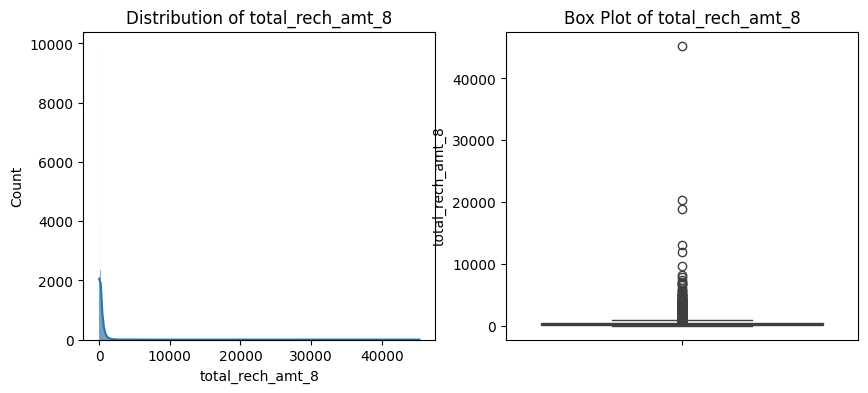

Column: total_rech_amt_6, Missing Data: 0.00%


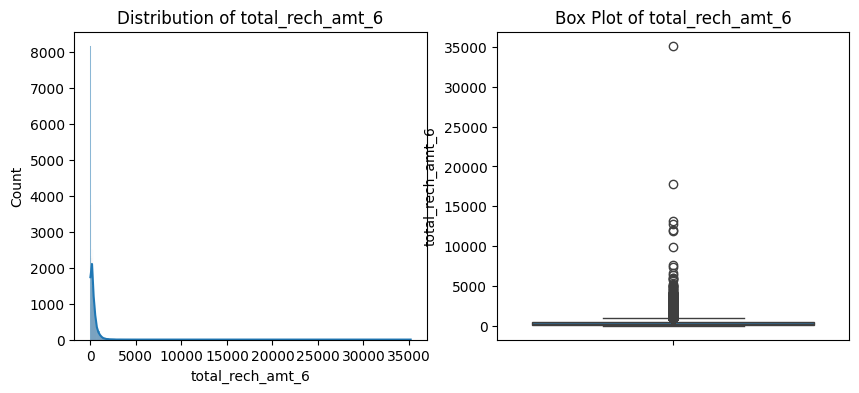

Column: total_rech_amt_7, Missing Data: 0.00%


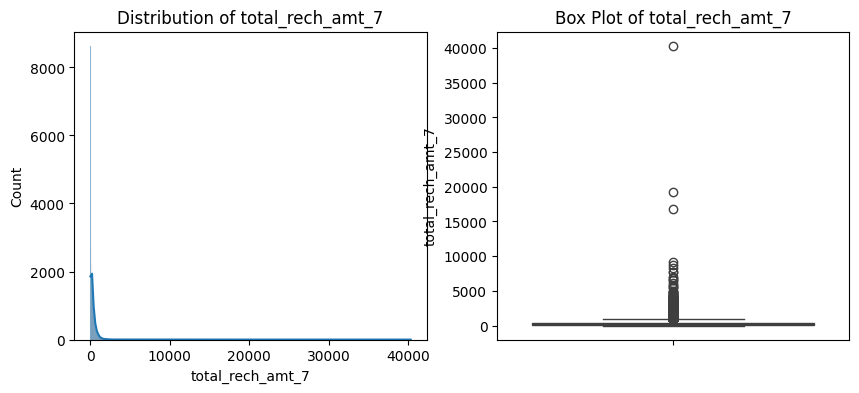

Column: total_ic_mou_8, Missing Data: 0.00%


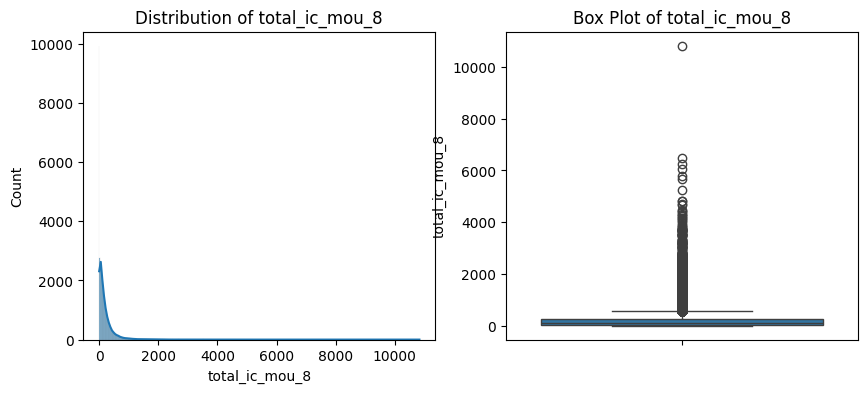

Column: total_ic_mou_7, Missing Data: 0.00%


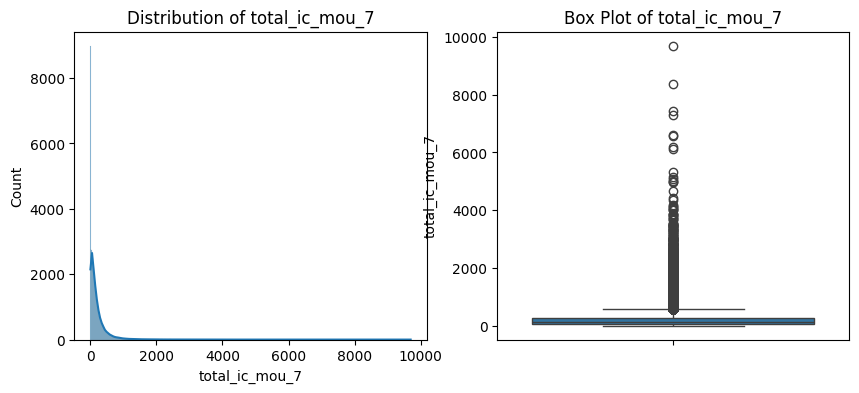

Column: total_ic_mou_6, Missing Data: 0.00%


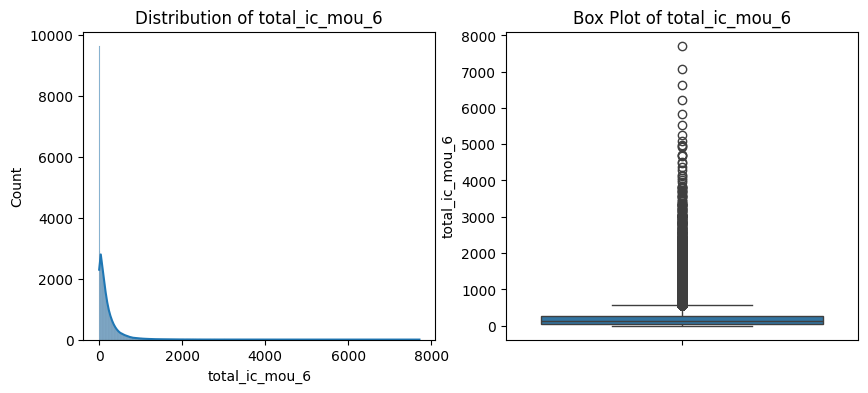

Column: total_og_mou_8, Missing Data: 0.00%


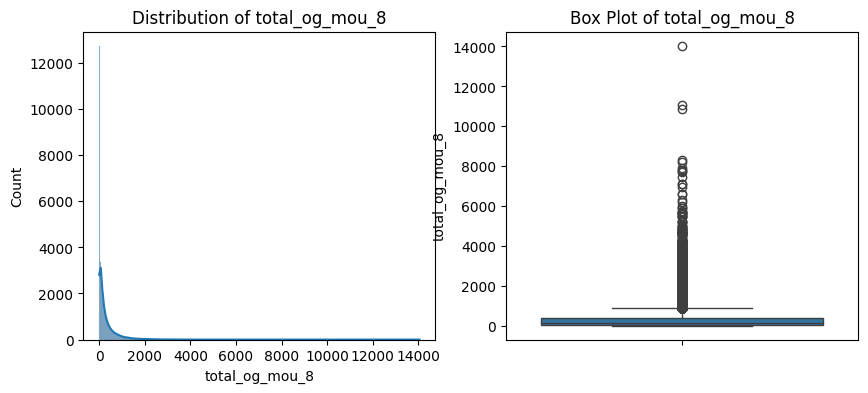

Column: total_og_mou_7, Missing Data: 0.00%


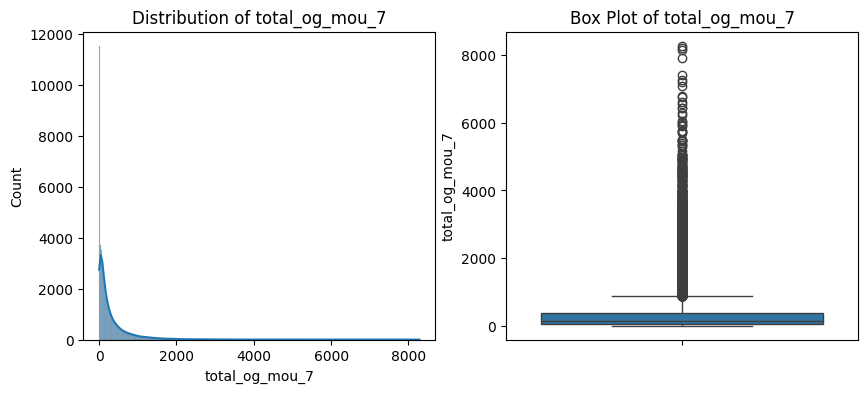

Column: total_og_mou_6, Missing Data: 0.00%


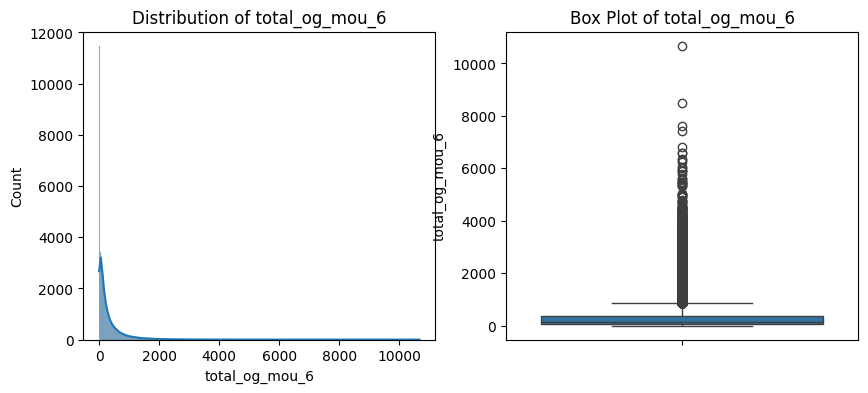

Column: offnet_mou_8, Missing Data: 0.00%


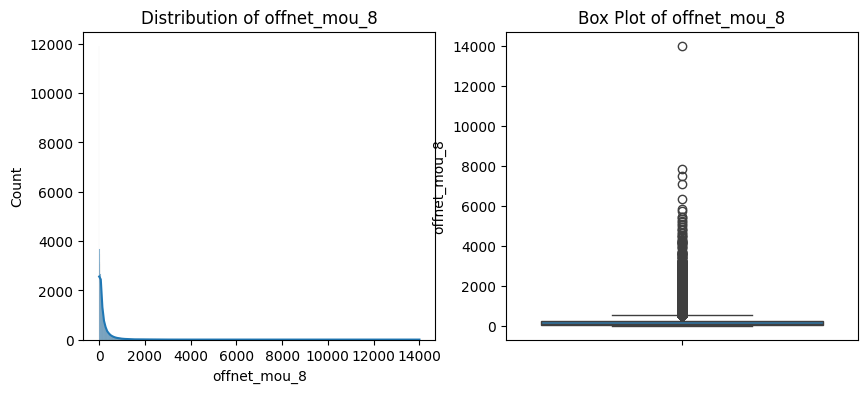

Column: offnet_mou_6, Missing Data: 0.00%


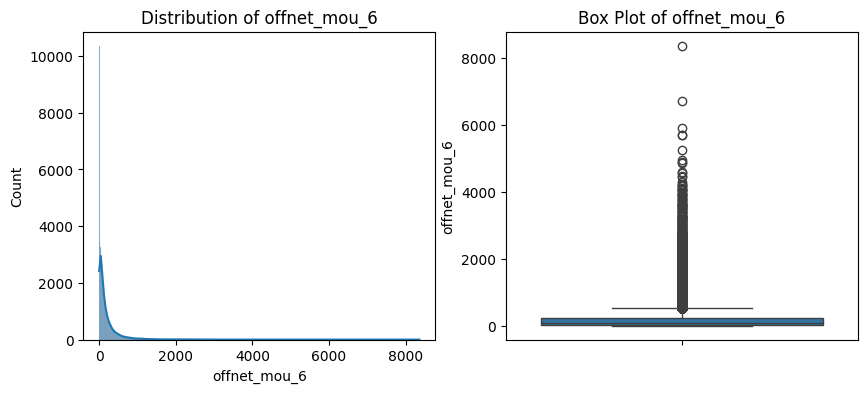

Column: offnet_mou_7, Missing Data: 0.00%


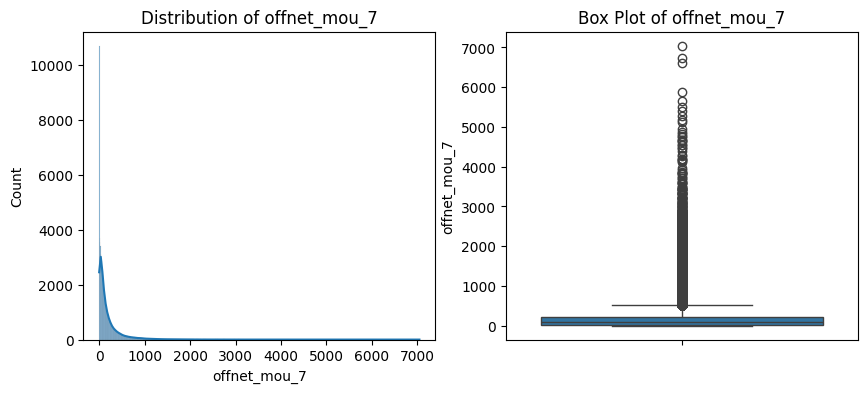

Column: vol_3g_mb_7, Missing Data: 0.00%


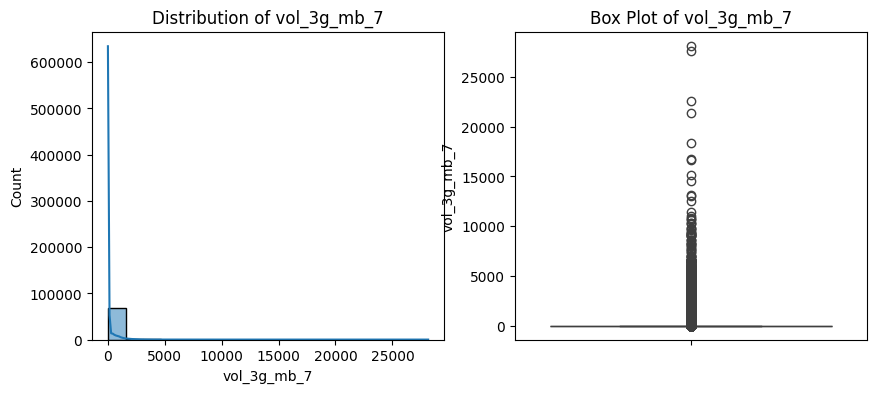

Column: vol_3g_mb_8, Missing Data: 0.00%


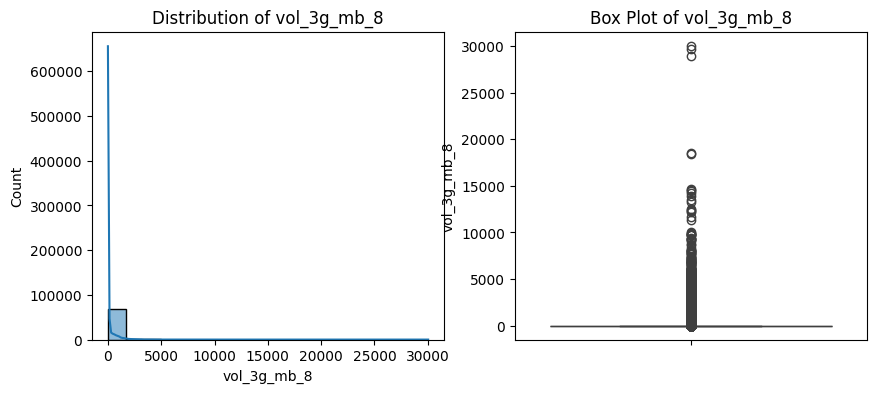

Column: vol_3g_mb_6, Missing Data: 0.00%


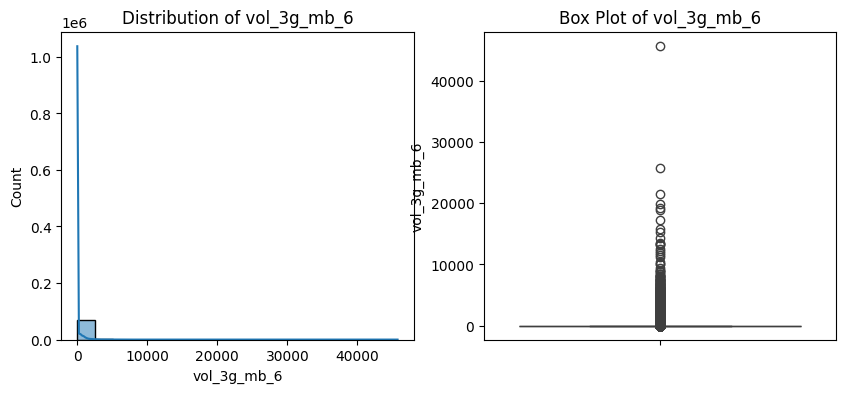

Column: vol_2g_mb_8, Missing Data: 0.00%


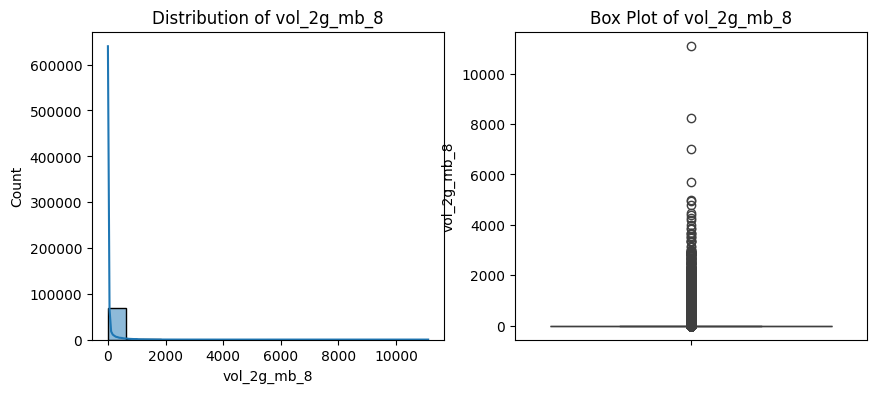

Column: vol_2g_mb_7, Missing Data: 0.00%


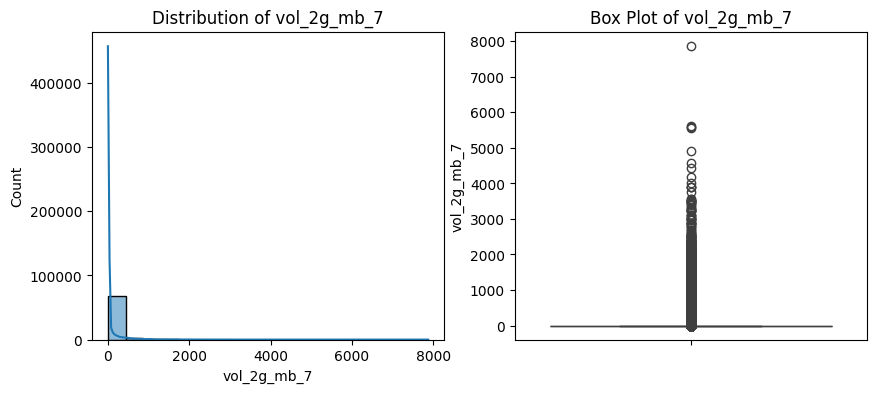

Column: vol_2g_mb_6, Missing Data: 0.00%


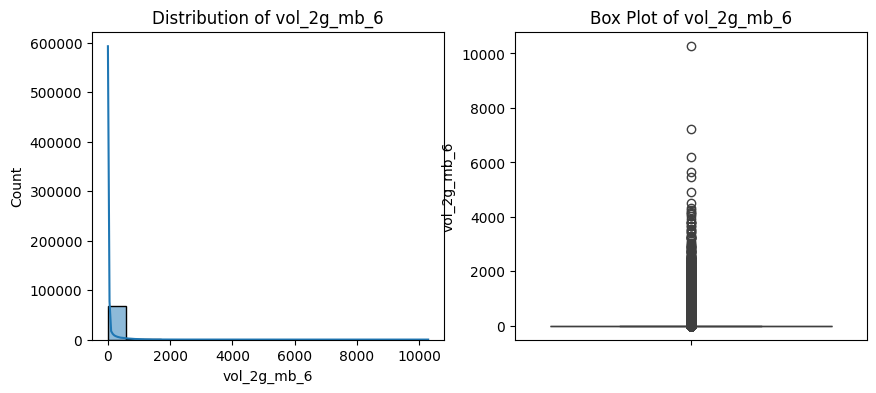

Column: aon, Missing Data: 0.00%


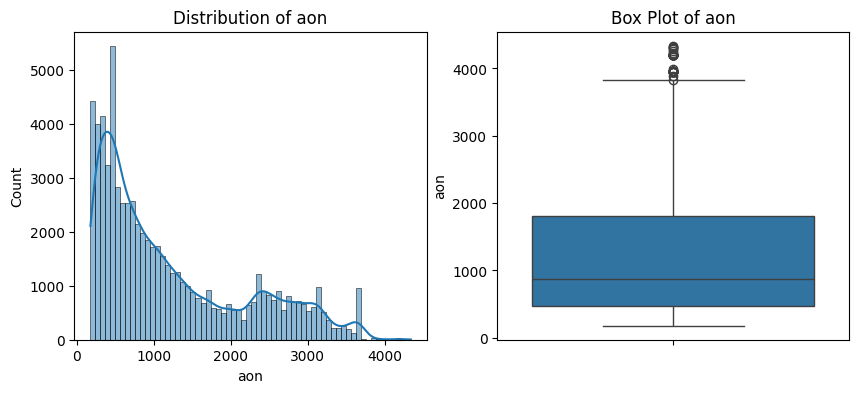

Column: arpu_6, Missing Data: 0.00%


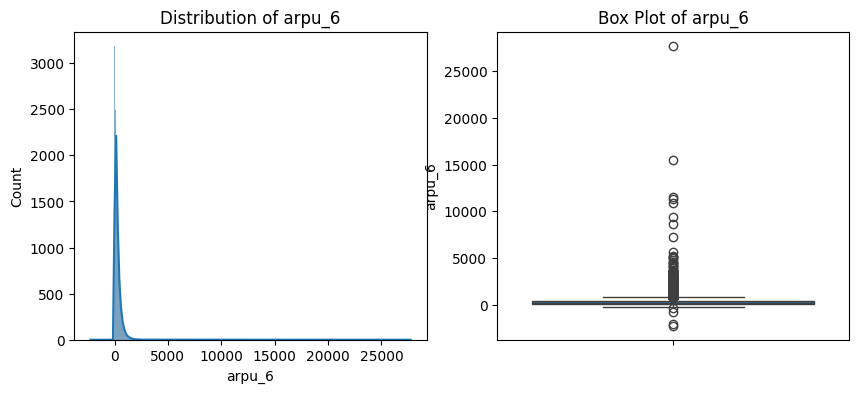

Column: arpu_7, Missing Data: 0.00%


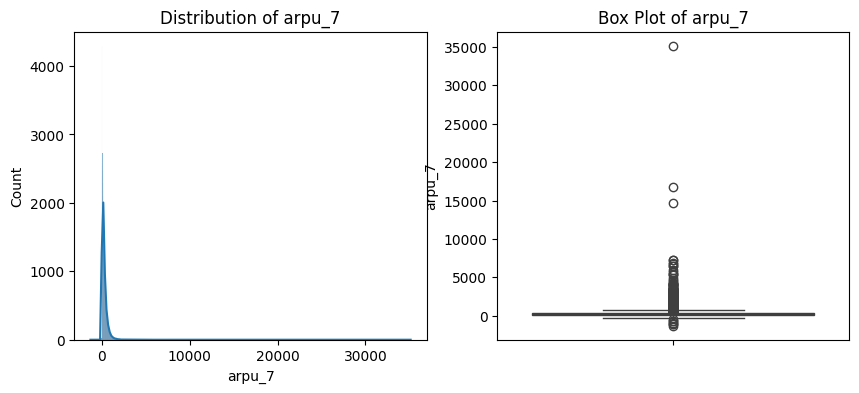

Column: arpu_8, Missing Data: 0.00%


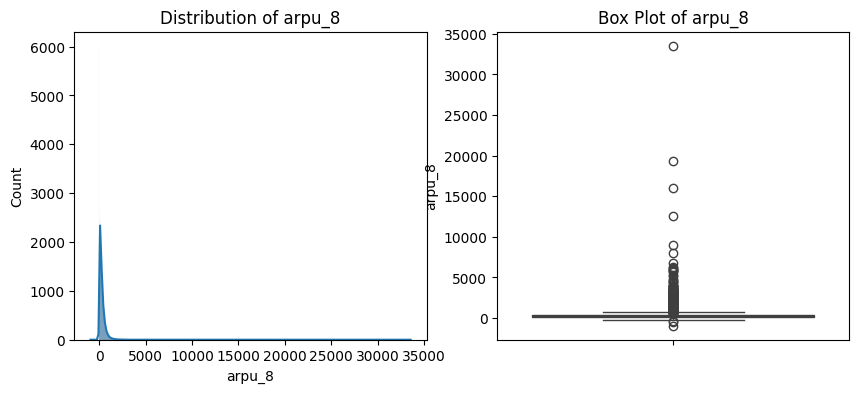

Column: total_rech_amt_6, Missing Data: 0.00%


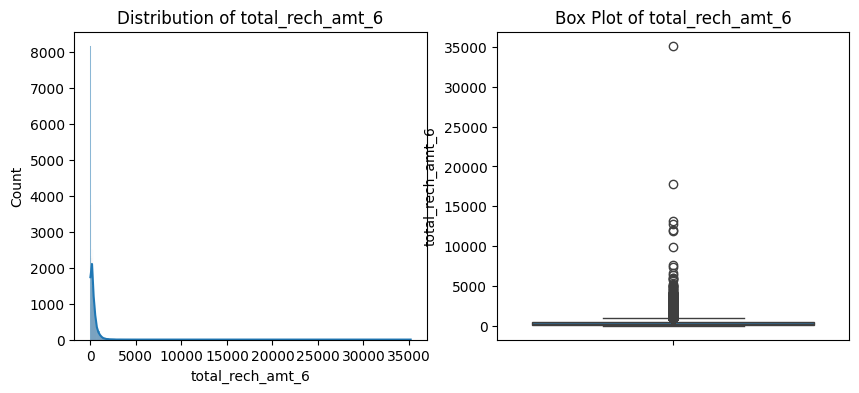

Column: total_rech_amt_7, Missing Data: 0.00%


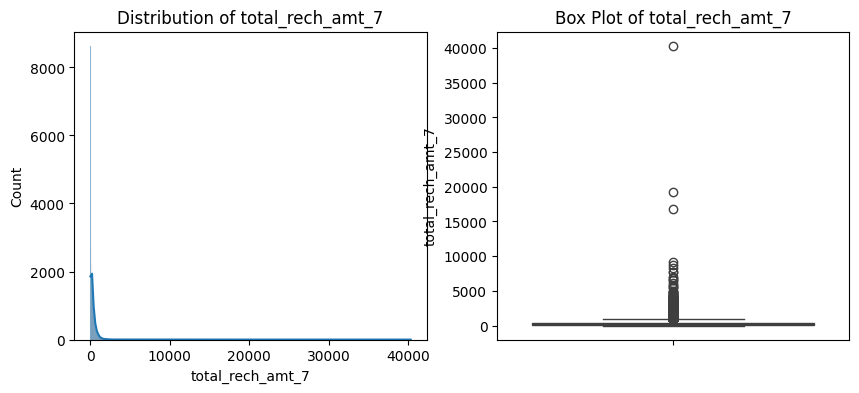

Column: total_rech_amt_8, Missing Data: 0.00%


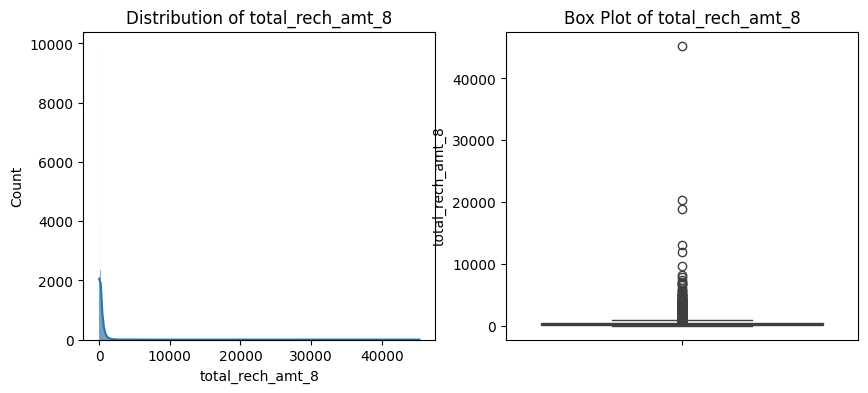

Column: rech_diff_6_8, Missing Data: 0.00%


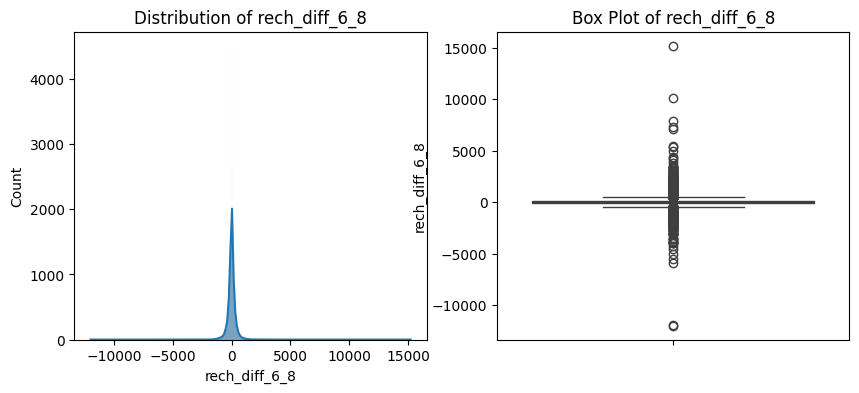

Column: arpu_diff_6_8, Missing Data: 0.00%


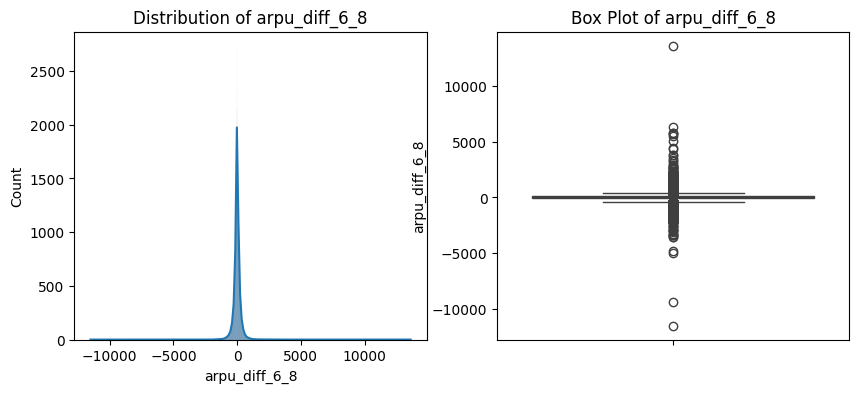

Column: og_mou_diff_6_8, Missing Data: 0.00%


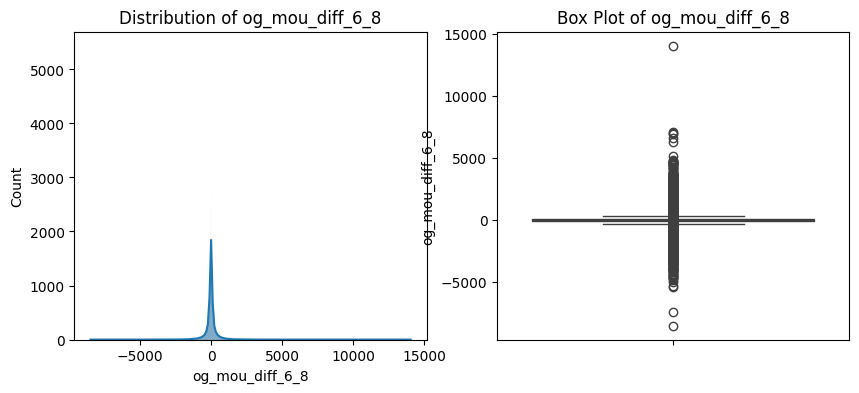

Column: churn_probability, Missing Data: 0.00%


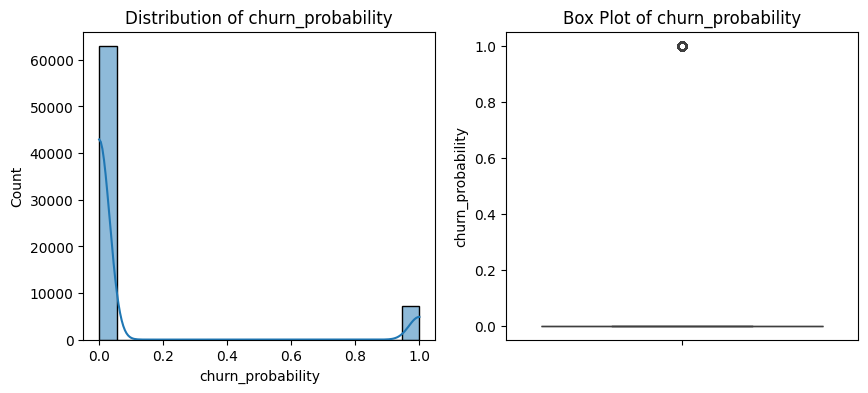

Column: night_pck_user_6, Missing Data: 0.00%


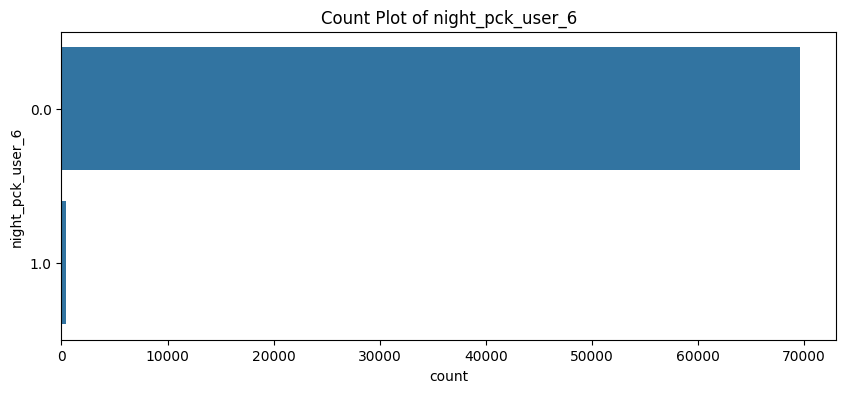

Column: night_pck_user_7, Missing Data: 0.00%


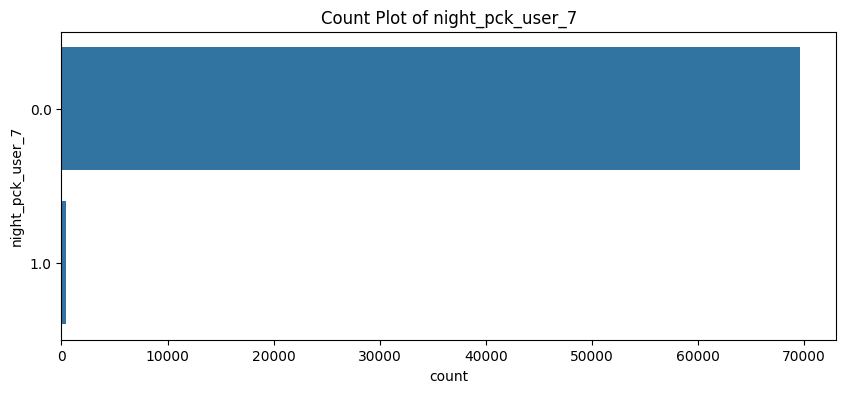

Column: night_pck_user_8, Missing Data: 0.00%


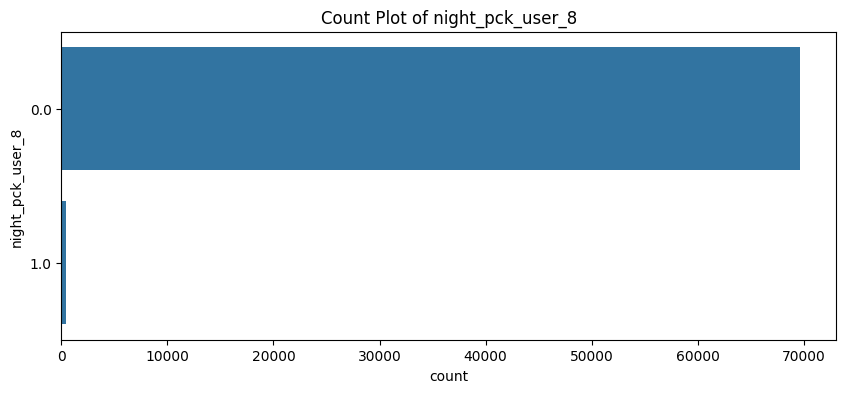

Column: fb_user_6, Missing Data: 0.00%


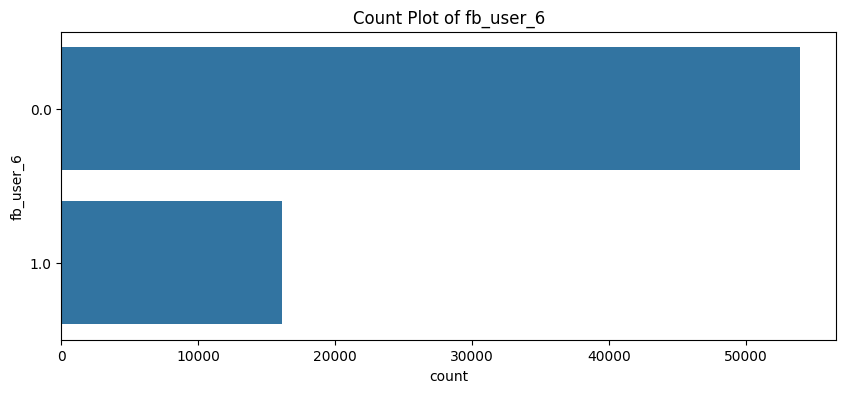

Column: fb_user_7, Missing Data: 0.00%


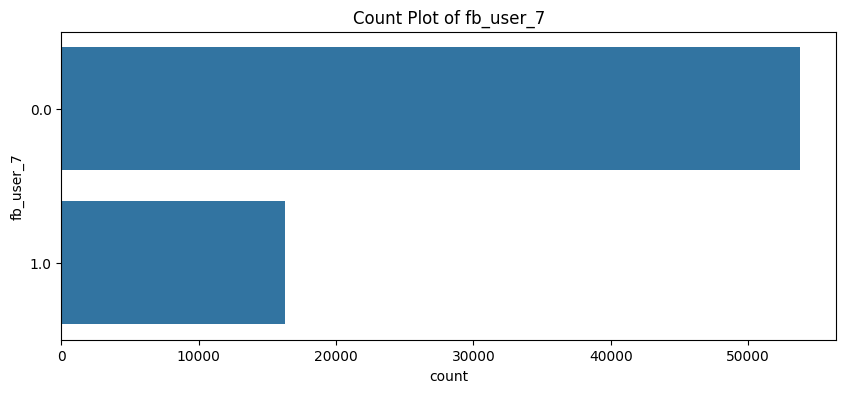

Column: fb_user_8, Missing Data: 0.00%


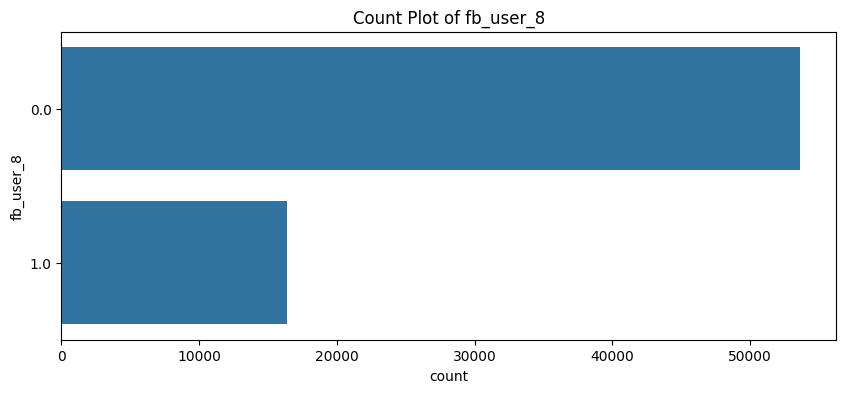

Column: month_present_7, Missing Data: 0.00%


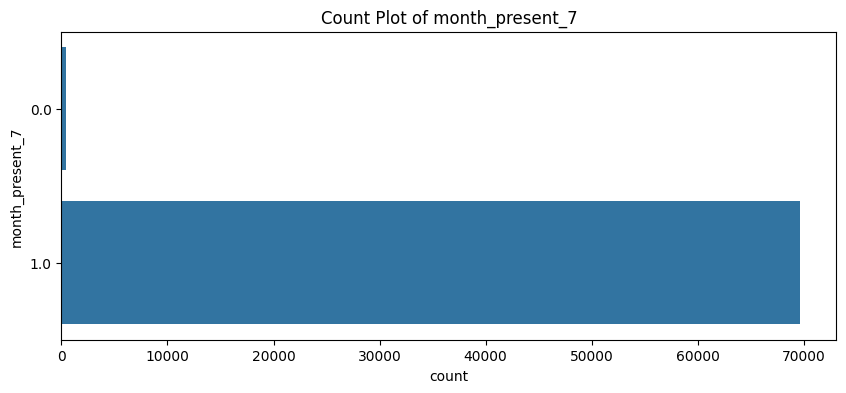

Column: month_present_8, Missing Data: 0.00%


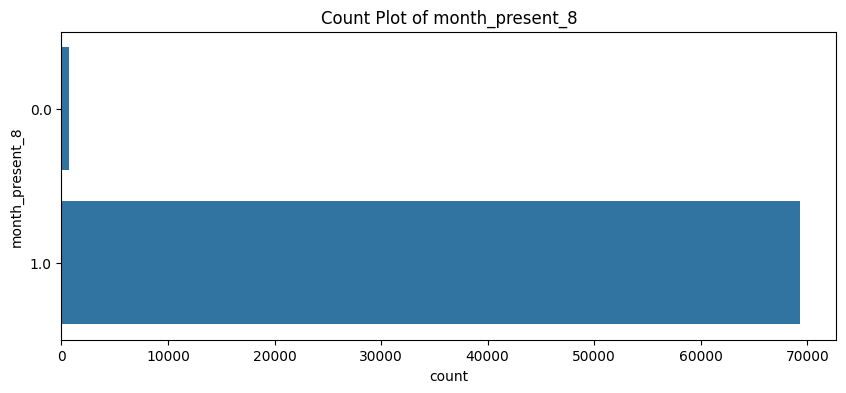

In [30]:
def univariate_analysis(df, column_list, plot_type='numerical'):
    """
    Perform univariate analysis for the specified columns in the DataFrame.

    Parameters:
    - df: DataFrame, the DataFrame containing the data.
    - column_list: list, a list of column names to perform analysis on.
    - plot_type: str, optional, the type of plot to generate, either 'numerical' for numerical columns
                 or 'categorical' for categorical columns. Default is 'numerical'.
    """
    for column in column_list:
        if column not in df.columns:
            print(f"Column {column} not found in dataframe.")
            continue

        # Calculate the percentage of missing data in the column
        missing_percentage = df[column].isna().sum() / len(df) * 100
        print(f"Column: {column}, Missing Data: {missing_percentage:.2f}%")

        # Proceed with plotting if missing data percentage is less than 30%
        if missing_percentage < 30:
            plt.figure(figsize=(10, 4))

            if plot_type == 'numerical':
                # Plot distribution and box plot for numerical data
                plt.subplot(1, 2, 1)
                sns.histplot(df[column].dropna(), kde=True)
                plt.title(f'Distribution of {column}')

                plt.subplot(1, 2, 2)
                sns.boxplot(y=df[column].dropna())
                plt.title(f'Box Plot of {column}')
            elif plot_type == 'categorical':
                # Plot count plot for categorical data
                sns.countplot(y=df[column].dropna())
                plt.title(f'Count Plot of {column}')
            
            plt.show()
        else:
            # Skip plotting if missing data percentage is high
            print(f"Skipping {column} due to high percentage of missing data.")

# Perform univariate analysis for numerical columns
univariate_analysis(df_refined_1, numeric_cols, plot_type='numerical')

# Perform univariate analysis for categorical columns
univariate_analysis(df_refined_1, categorical_cols, plot_type='categorical')

# Important finding from the univariate analysis:
- The majority of outgoing minutes have a monthly duration of less than 1000 minutes. The "age on network" IQR ranges from 500 to 1800 days.
- The vast majority of consumers don't own night packs.
- Each month, almost 20% of users have social media usage bundles (fb_user).


#### For numerical variables with churn probability, bivariate analysis 

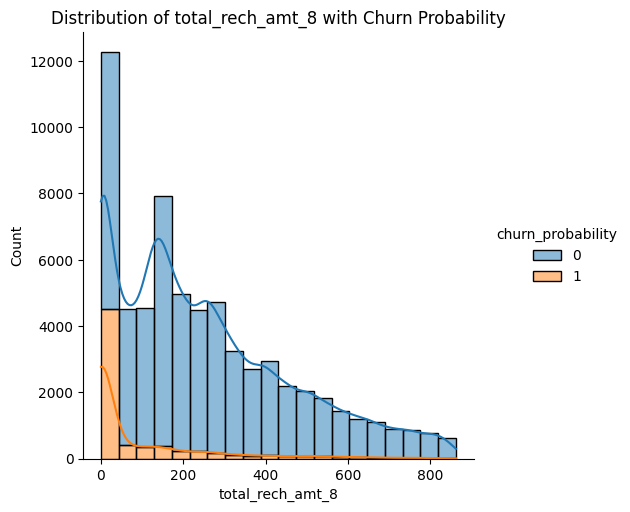

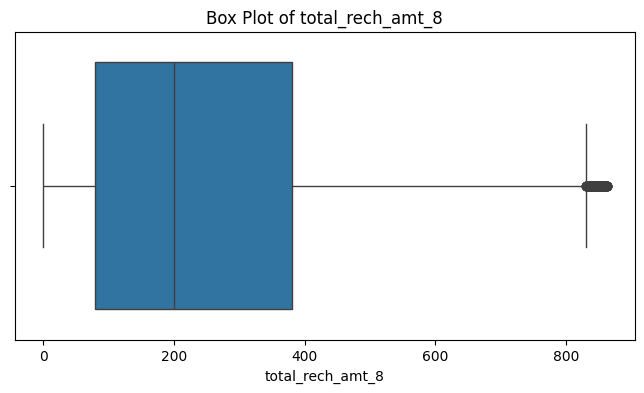

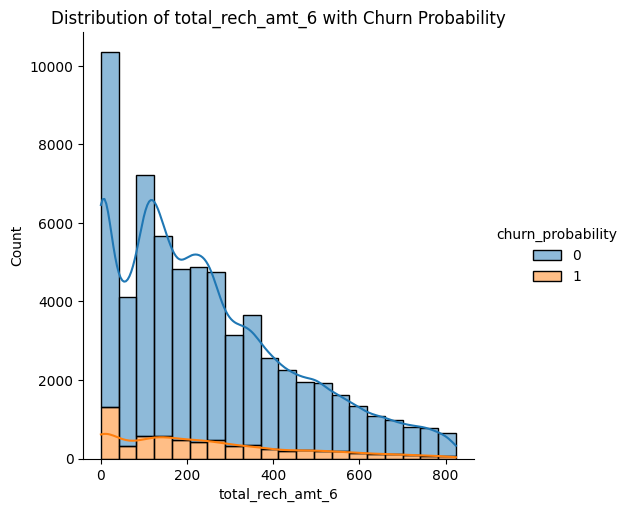

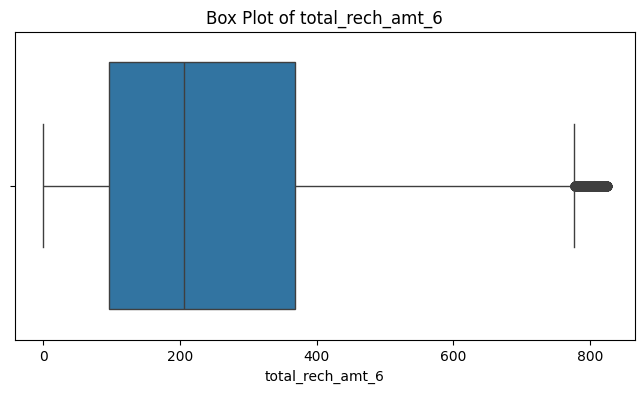

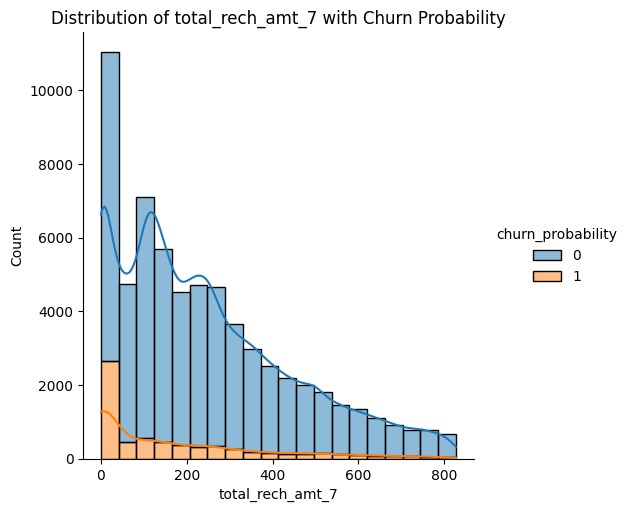

...

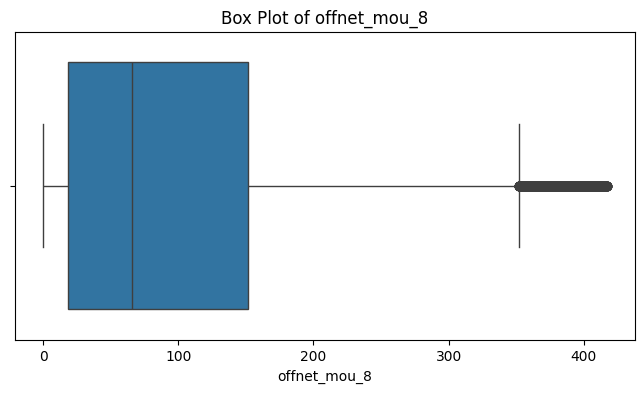

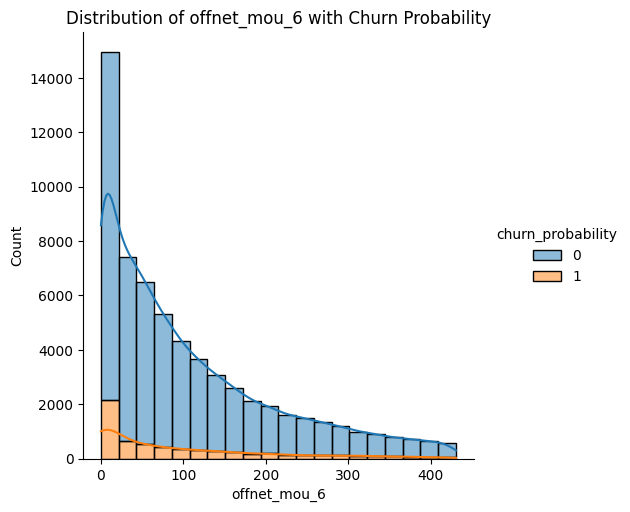

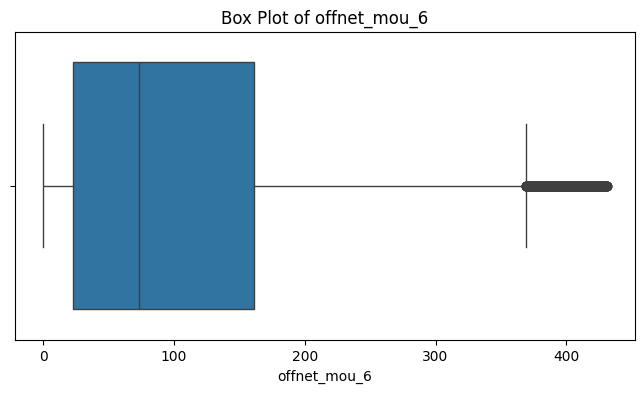

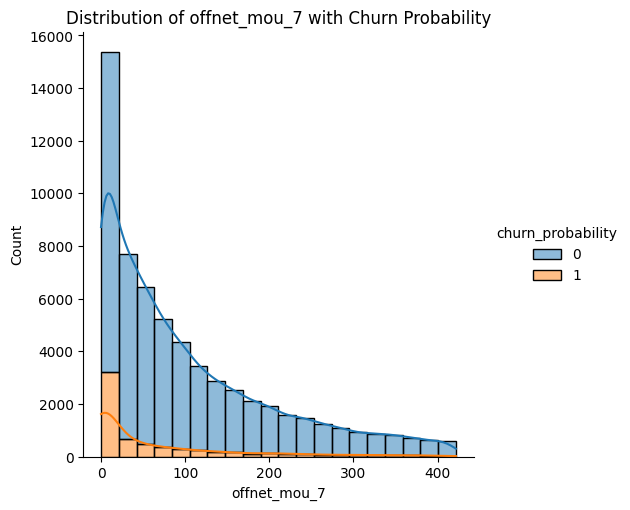

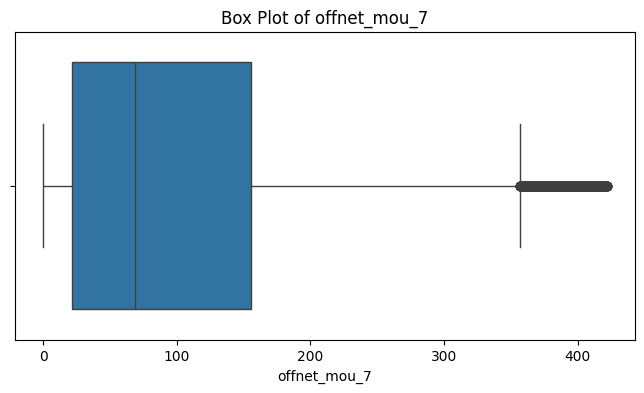

ValueError: `dataset` input should have multiple elements.

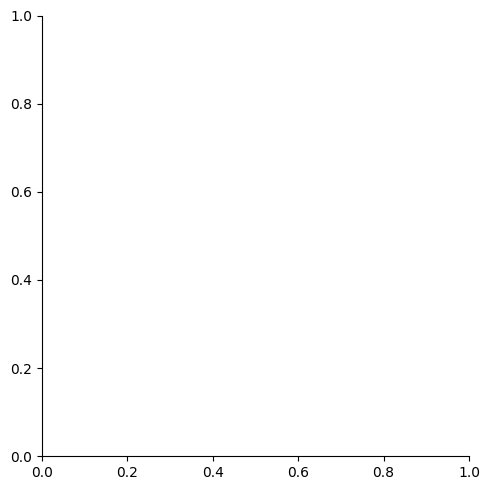

In [31]:
# Iterating over numerical columns for outlier analysis
for column_name in numeric_cols:
    arr = np.array(df_refined_1[column_name])
    uq = np.percentile(arr, 70)
    lq = np.percentile(arr, 20)
    iqr = uq - lq
    ul = uq + (1.5 * iqr)
    ll = lq - (1.5 * iqr)
    
    # Filtering data within upper and lower bounds
    filtered_data = df_refined_1[(df_refined_1[column_name] < ul) & (df_refined_1[column_name] > ll)]
    
    # Plotting distribution of filtered data with hue based on churn probability
    sns.displot(data=filtered_data, x=column_name, kde=True, hue='churn_probability', multiple='stack', bins=20)
    plt.xlabel(column_name)
    plt.title(f'Distribution of {column_name} with Churn Probability')
    plt.show()
    
    # Plotting boxplot to identify outliers
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=column_name, data=filtered_data)
    plt.xlabel(column_name)
    plt.title(f'Box Plot of {column_name}')
    plt.show()

#### Comparing the churn probability of categorical variables using bivariate analysis

night_pck_user_6


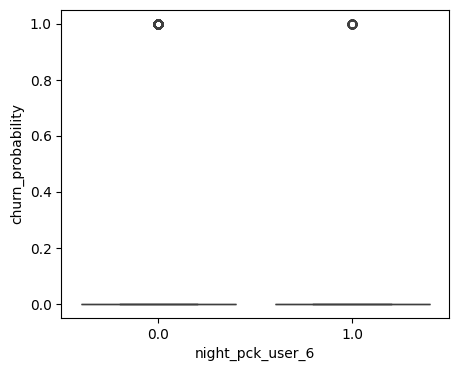

night_pck_user_7


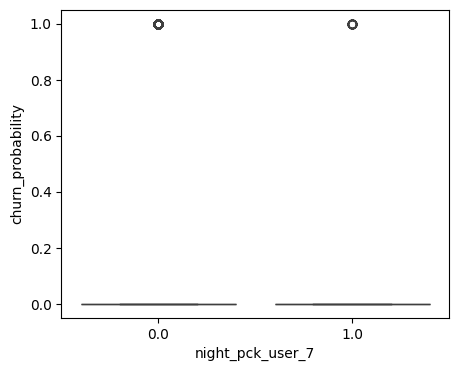

night_pck_user_8


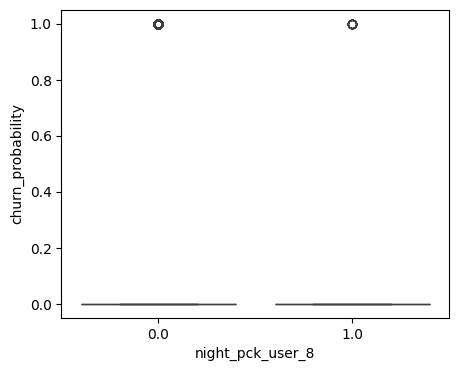

fb_user_6


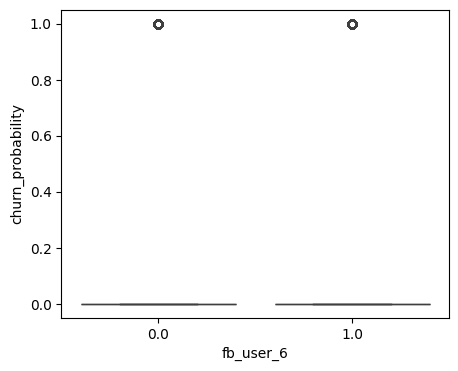

fb_user_7


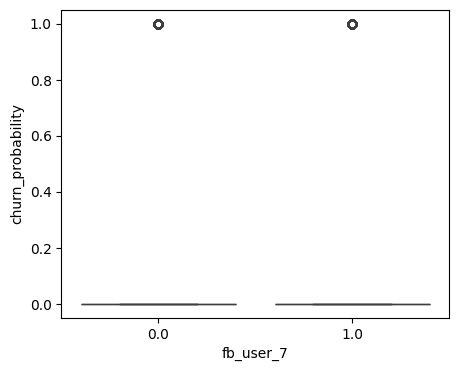

fb_user_8


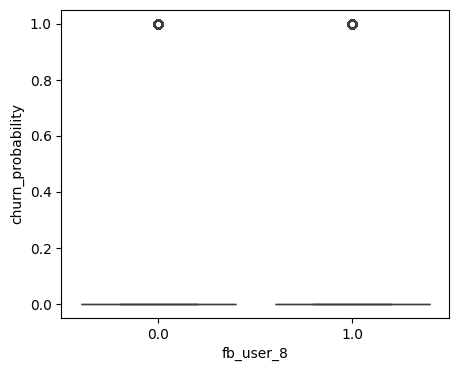

month_present_7


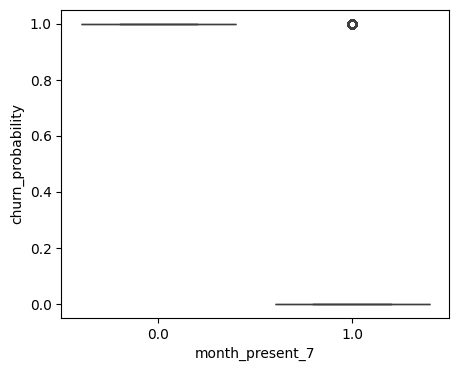

month_present_8


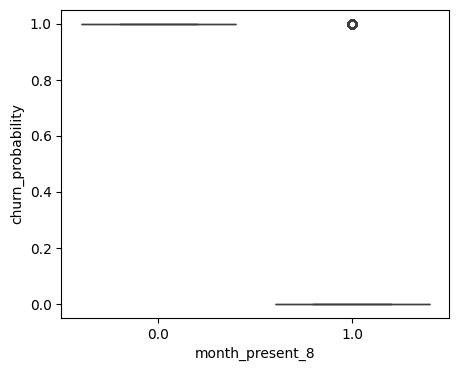

In [32]:
# Box plots showing all categorical predictor factors versus the goal variable, sale price, are used in bivariate analysis.

# Iterating over categorical columns for boxplot analysis
for col1 in categorical_cols:
    # Printing the name of the current column
    print(col1)
    
    # Creating a boxplot to analyze the distribution of churn probability across categories
    plt.figure(figsize=(5, 4))
    sns.boxplot(x=col1, y='churn_probability', data=df_refined_1)
    plt.show()

# Multivariate Analysis:


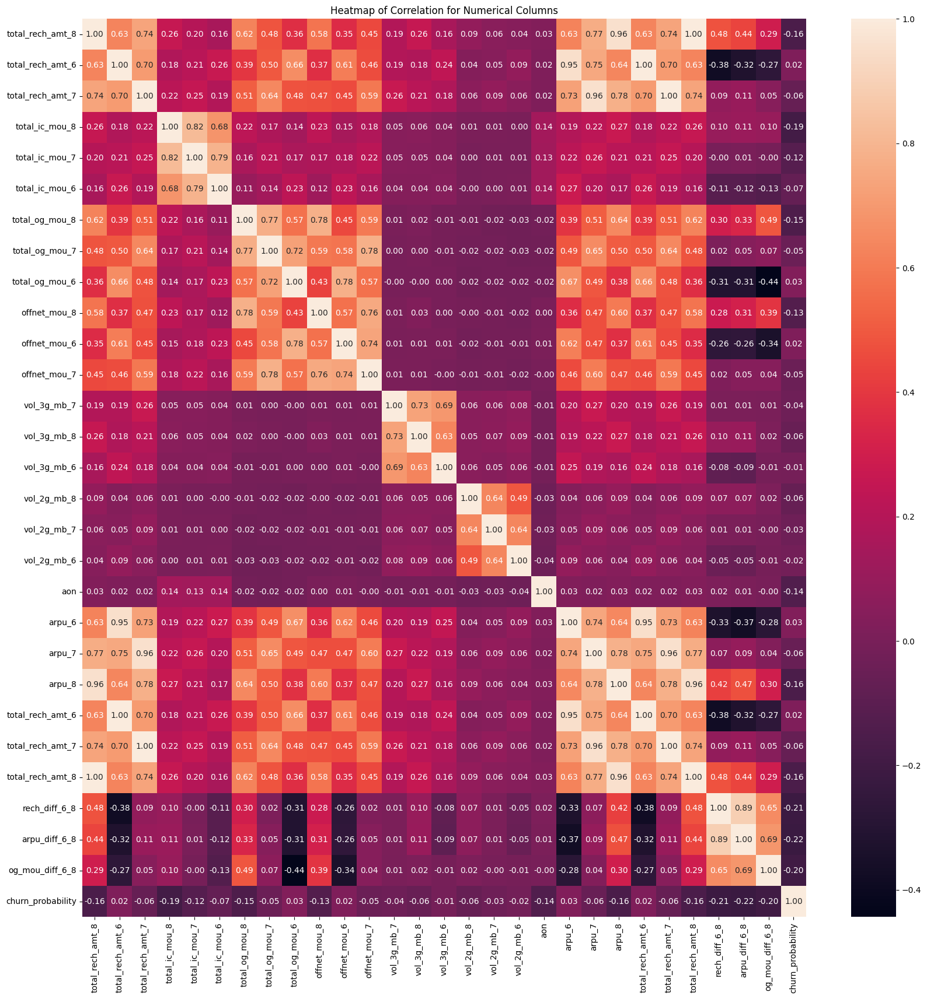

In [33]:
# Plotting a heatmap to visualize correlations between numerical columns
plt.figure(figsize=(20, 20))  # Set the figure size
sns.heatmap(df_refined_1[numeric_cols].corr(), annot=True, fmt='.2f')  # Plot heatmap with correlation values annotated
plt.title("Heatmap of Correlation for Numerical Columns")  # Set the title of the plot
plt.show()  # Show the plot

In [37]:
# Creating pairplots to visualize relationships between numerical columns
sns.set()  # Set seaborn style
sns.pairplot(data = df_refined_1, vars = numeric_cols, height=2.5)  # Plot pairplots for numerical columns
plt.title("Pairplot of Numerical Columns")  # Set the title of the plot
plt.show()  # Show the plot

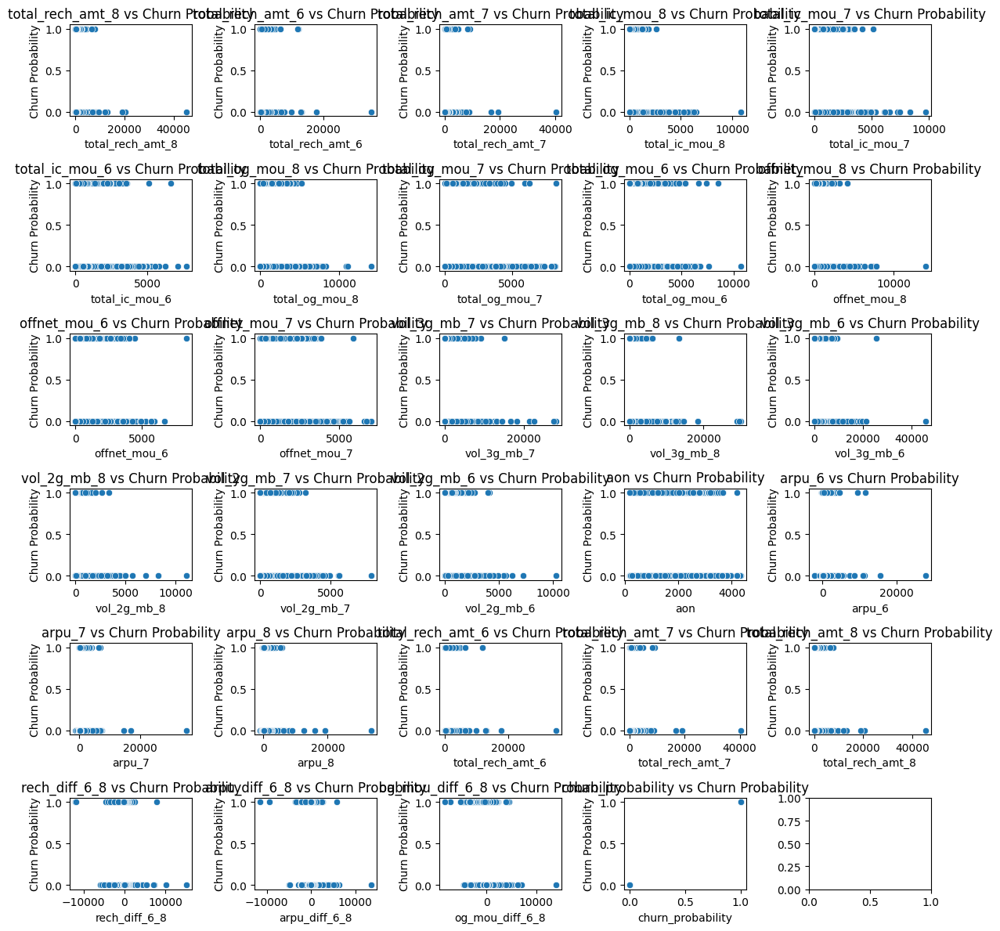

In [34]:
# Checking the impact of numerical columns on churn probability for predictive ability
fig, axes = plt.subplots(figsize=(12, 12), nrows=6, ncols=5)  # Create subplots grid

for i, col in enumerate(numeric_cols):
    sns.scatterplot(x=df_refined_1[col], y=df_refined_1['churn_probability'], ax=axes[i//5, i%5])  # Scatter plot for each numerical column
    axes[i//5, i%5].set_title(f"{col} vs Churn Probability")  # Set subplot title
    axes[i//5, i%5].set_xlabel(col)  # Set xlabel
    axes[i//5, i%5].set_ylabel("Churn Probability")  # Set ylabel

plt.tight_layout()  # Adjust layout
plt.show()  # Show the plot

# Important takeaways from both multivariate and bivariate analysis:
- As anticipated, there is a strong correlation between recharge amounts and revenue per user. 
- Within each measure across groups, there is a strong correlation, for example, between outgoing minutes and recharge amounts over time. 
- The variations in recharge amounts, arpu, and outgoing minutes are highly correlated, but they also have a weak correlation with churn probability.
- For the month of August, the total outgoing minutes are high, with a churn probability of 1.
- Months present 7 and 8 are absent, indicating a 1 churn probability.


## Principal Findings of Bivariate and Multivariate Analysis:

In [35]:
# # Importing necessary libraries for data preprocessing, model selection, evaluation metrics, and machine learning algorithms.
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, auc, roc_curve, confusion_matrix, f1_score


In [36]:
# Splitting the DataFrame into features (X) and target variable (y)
y = df_refined_1.pop('churn_probability')  # Extracting 'churn_probability' column as target variable
X = df_refined_1  # Features without 'churn_probability' column

In [37]:
#Scaling the df:
scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)
X_data=pd.DataFrame(X_scaled)
X_data.columns=X.columns
X_data

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,...,last_day_rch_amt_6,max_rech_amt_8,days_since_rechg_6,days_since_rechg_7,days_since_rechg_8,month_present_7,month_present_8,rech_diff_6_8,arpu_diff_6_8,og_mou_diff_6_8
0,0.000728,0.002282,0.002714,0.000470,0.0,0.000053,0.000000,0.000000,0.000000,0.0,...,0.016209,0.002248,0.300000,0.709677,0.258065,1.0,1.0,0.438552,0.457182,0.373291
1,0.000984,0.002311,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.084672,0.0,...,0.000000,0.011238,0.633333,0.709677,0.193548,1.0,1.0,0.442852,0.459838,0.378140
2,0.000607,0.002771,0.001157,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,...,0.017456,0.000000,0.666667,0.322581,0.258065,1.0,1.0,0.438442,0.455707,0.374227
3,0.002233,0.007482,0.000510,0.004763,0.0,0.000000,0.000000,0.000330,0.022824,0.0,...,0.027431,0.011238,0.533333,0.354839,0.225806,1.0,1.0,0.439912,0.456326,0.375750
4,0.000249,0.002614,0.000000,0.000929,0.0,0.000000,0.008516,0.000000,0.000000,0.0,...,0.006234,0.006743,0.200000,0.193548,0.064516,1.0,1.0,0.434840,0.452588,0.374626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69994,0.003164,0.023800,0.002139,0.018072,0.0,0.000000,0.000000,0.020799,0.002444,0.0,...,0.012469,0.029220,0.433333,0.032258,0.032258,1.0,1.0,0.457993,0.470606,0.394158
69995,0.002159,0.004791,0.003127,0.009542,0.0,0.016864,0.000000,0.000038,0.000000,0.0,...,0.012469,0.009890,0.100000,0.032258,0.161290,1.0,1.0,0.444983,0.462336,0.381815
69996,0.008090,0.038043,0.000000,0.027868,0.0,0.000000,0.213466,0.000000,0.000000,0.0,...,0.069576,0.078445,0.200000,0.064516,0.096774,1.0,1.0,0.432598,0.454453,0.373610
69997,0.000097,0.000721,0.001335,0.001782,0.0,0.000331,0.004862,0.000061,0.000000,0.0,...,0.000000,0.032592,0.066667,0.419355,0.193548,1.0,1.0,0.432415,0.454405,0.375825


In [38]:
# Splitting the dataset into training and testing subsets using train_test_split function.
# The features (X_data) and target variable (y) are split into X_train, X_test, y_train, and y_test respectively.
# The train_size parameter specifies the proportion of the dataset to include in the training set (70% in this case).
# The random_state parameter ensures reproducibility of results by fixing the random seed (set to 42).
X_train, X_test, y_train, y_test = train_test_split(X_data, y, train_size=0.7, random_state=42)

# Displaying the shapes of the training and testing subsets
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((48999, 154), (21000, 154), (48999,), (21000,))

## Managing Unbalanced Data with Random Oversampler

In [41]:
# Importing RandomOverSampler from imbalanced-learn library to handle class imbalance.
from imblearn.over_sampling import RandomOverSampler

# Instantiating RandomOverSampler with sampling strategy of 1 (balance the classes).
os = RandomOverSampler(sampling_strategy=1)

# Resampling the training data to balance the classes.
X_train_resampled, y_train_resampled = os.fit_resample(X_train, np.array(y_train))

# Printing the shape of resampled training data and the percentage of positive class instances.
print(X_train_resampled.shape, y_train_resampled.shape)
print(f"Percentage of positive class instances after resampling: {y_train_resampled.sum() / len(y_train_resampled) * 100:.2f}%")

(88044, 154) (88044,)
Percentage of positive class instances after resampling: 50.00%


Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END ......max_depth=5, n_estimators=20;, score=0.942 total time=   3.0s
[CV 2/3] END ......max_depth=5, n_estimators=20;, score=0.942 total time=   3.0s
[CV 3/3] END ......max_depth=5, n_estimators=20;, score=0.942 total time=   3.0s
[CV 1/3] END ......max_depth=5, n_estimators=30;, score=0.942 total time=   4.6s
[CV 2/3] END ......max_depth=5, n_estimators=30;, score=0.942 total time=   5.0s
[CV 3/3] END ......max_depth=5, n_estimators=30;, score=0.941 total time=   4.9s
[CV 1/3] END ......max_depth=5, n_estimators=50;, score=0.942 total time=   8.8s
[CV 2/3] END ......max_depth=5, n_estimators=50;, score=0.942 total time=   8.6s
[CV 3/3] END ......max_depth=5, n_estimators=50;, score=0.942 total time=   8.2s
[CV 1/3] END .....max_depth=10, n_estimators=20;, score=0.941 total time=   7.1s
[CV 2/3] END .....max_depth=10, n_estimators=20;, score=0.941 total time=   7.9s
[CV 3/3] END .....max_depth=10, n_estimators=20;,

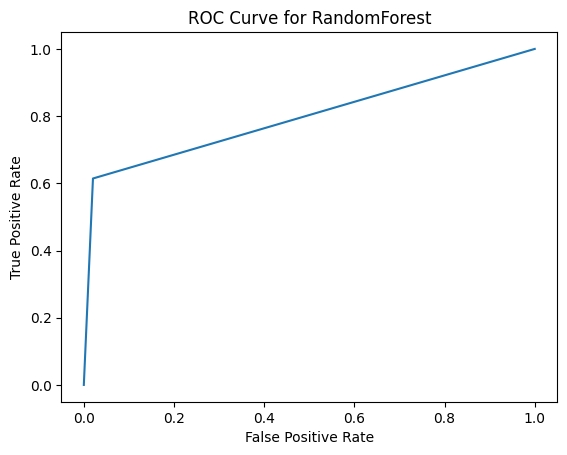

RandomForest :
Accuracy Score: 0.9422380952380952
Precision Score: 0.776084407971864
AUC Score: 0.7970572609990281
F1 Score: 0.6858326858326859
Recall: 0.614385150812065
Specificity: 0.979729371185991
Confusion Matrix:
 [[18463   382]
 [  831  1324]]
__________________________________
Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END .......criterion=gini, max_depth=5;, score=0.938 total time=   2.2s
[CV 2/3] END .......criterion=gini, max_depth=5;, score=0.941 total time=   2.2s
[CV 3/3] END .......criterion=gini, max_depth=5;, score=0.940 total time=   2.2s
[CV 1/3] END ......criterion=gini, max_depth=10;, score=0.930 total time=   4.7s
[CV 2/3] END ......criterion=gini, max_depth=10;, score=0.930 total time=   4.6s
[CV 3/3] END ......criterion=gini, max_depth=10;, score=0.932 total time=   4.8s
[CV 1/3] END ......criterion=gini, max_depth=12;, score=0.927 total time=   5.8s
[CV 2/3] END ......criterion=gini, max_depth=12;, score=0.927 total time=   6.2s
[CV 3/

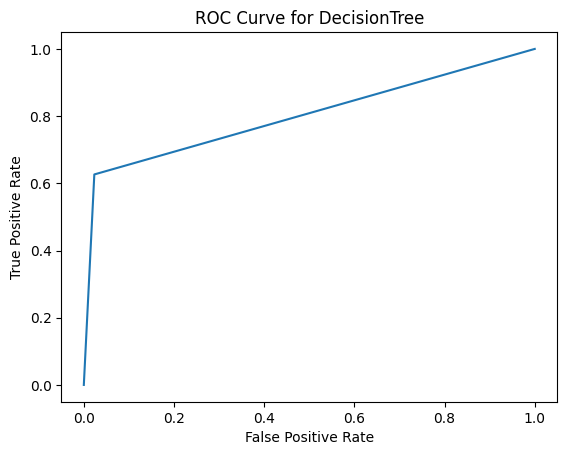

DecisionTree :
Accuracy Score: 0.9407619047619048
Precision Score: 0.7546115148127446
AUC Score: 0.8015774061075853
F1 Score: 0.6845841784989858
Recall: 0.6264501160092807
Specificity: 0.9767046962058902
Confusion Matrix:
 [[18406   439]
 [  805  1350]]
__________________________________
Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END learning_rate=0.1, n_estimators=20;, score=0.941 total time=  36.9s
[CV 2/3] END learning_rate=0.1, n_estimators=20;, score=0.942 total time=  37.4s
[CV 3/3] END learning_rate=0.1, n_estimators=20;, score=0.941 total time=  37.7s
[CV 1/3] END learning_rate=0.1, n_estimators=50;, score=0.941 total time= 1.4min
[CV 2/3] END learning_rate=0.1, n_estimators=50;, score=0.943 total time= 1.3min
[CV 3/3] END learning_rate=0.1, n_estimators=50;, score=0.942 total time= 1.3min
[CV 1/3] END learning_rate=0.01, n_estimators=20;, score=0.898 total time=  30.5s
[CV 2/3] END learning_rate=0.01, n_estimators=20;, score=0.898 total time=  29.6s
[

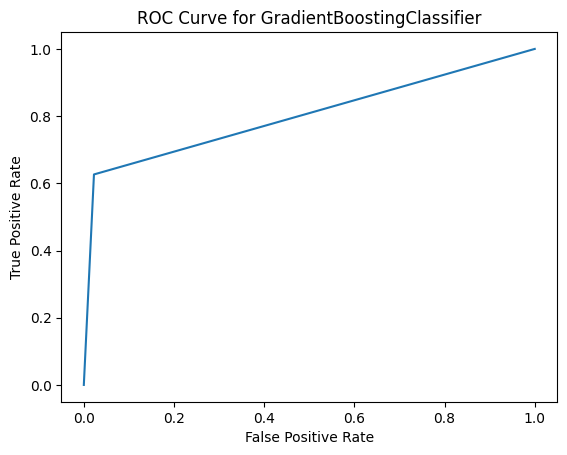

GradientBoostingClassifier :
Accuracy Score: 0.9414761904761905
Precision Score: 0.7609921082299888
AUC Score: 0.8019753896575986
F1 Score: 0.687197760244337
Recall: 0.6264501160092807
Specificity: 0.9775006633059167
Confusion Matrix:
 [[18421   424]
 [  805  1350]]
__________________________________
Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV 1/3] END .................C=0.1, penalty=l2;, score=0.909 total time=   0.7s
[CV 2/3] END .................C=0.1, penalty=l2;, score=0.910 total time=   1.0s
[CV 3/3] END .................C=0.1, penalty=l2;, score=0.911 total time=   0.8s
[CV 1/3] END ...........C=0.1, penalty=elasticnet;, score=nan total time=   0.0s
[CV 2/3] END ...........C=0.1, penalty=elasticnet;, score=nan total time=   0.0s
[CV 3/3] END ...........C=0.1, penalty=elasticnet;, score=nan total time=   0.0s
[CV 1/3] END .................C=0.5, penalty=l2;, score=0.911 total time=   1.2s
[CV 2/3] END .................C=0.5, penalty=l2;, score=0.912 total tim

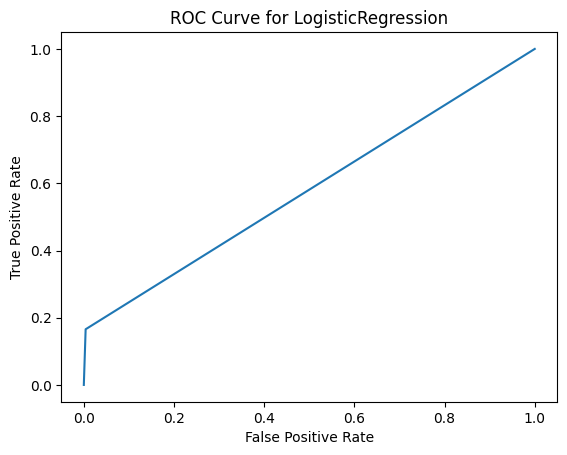

LogisticRegression :
Accuracy Score: 0.9107619047619048
Precision Score: 0.8244803695150116
AUC Score: 0.5808141764633821
F1 Score: 0.2758887171561051
Recall: 0.165661252900232
Specificity: 0.9959671000265322
Confusion Matrix:
 [[18769    76]
 [ 1798   357]]
__________________________________
Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV 1/3] END learning_rate=0.1, n_estimators=30;, score=0.942 total time=   1.6s
[CV 2/3] END learning_rate=0.1, n_estimators=30;, score=0.944 total time=   2.0s
[CV 3/3] END learning_rate=0.1, n_estimators=30;, score=0.943 total time=   1.8s
[CV 1/3] END learning_rate=0.1, n_estimators=50;, score=0.943 total time=   2.6s
[CV 2/3] END learning_rate=0.1, n_estimators=50;, score=0.944 total time=   2.6s
[CV 3/3] END learning_rate=0.1, n_estimators=50;, score=0.943 total time=   2.6s
[CV 1/3] END learning_rate=0.01, n_estimators=30;, score=0.898 total time=   1.8s
[CV 2/3] END learning_rate=0.01, n_estimators=30;, score=0.898 total time=   1

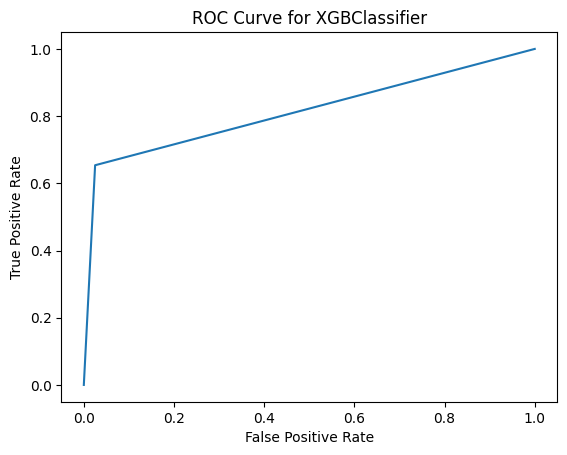

XGBClassifier :
Accuracy Score: 0.942
Precision Score: 0.7490696438064859
AUC Score: 0.8143909374251666
F1 Score: 0.6982160555004956
Recall: 0.6538283062645012
Specificity: 0.9749535685858318
Confusion Matrix:
 [[18373   472]
 [  746  1409]]
__________________________________
Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV 1/3] END ........depth=8, learning_rate=0.1;, score=0.941 total time= 1.8min
[CV 2/3] END ........depth=8, learning_rate=0.1;, score=0.942 total time= 1.7min
[CV 3/3] END ........depth=8, learning_rate=0.1;, score=0.943 total time= 1.8min
[CV 1/3] END .......depth=8, learning_rate=0.01;, score=0.942 total time= 1.7min
[CV 2/3] END .......depth=8, learning_rate=0.01;, score=0.944 total time= 1.8min
[CV 3/3] END .......depth=8, learning_rate=0.01;, score=0.943 total time= 1.8min
[CV 1/3] END .......depth=10, learning_rate=0.1;, score=0.942 total time= 8.1min
[CV 2/3] END .......depth=10, learning_rate=0.1;, score=0.943 total time= 7.8min
[CV 3/3] END ..

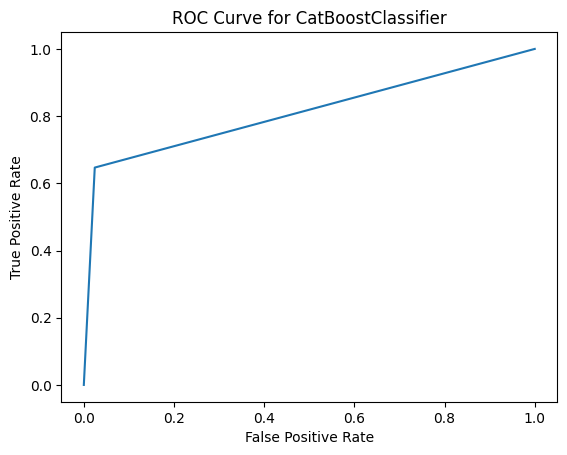

CatBoostClassifier :
Accuracy Score: 0.942
Precision Score: 0.7531064289573204
AUC Score: 0.8113086425529059
F1 Score: 0.6959560659011482
Recall: 0.6468677494199536
Specificity: 0.9757495356858583
Confusion Matrix:
 [[18388   457]
 [  761  1394]]
__________________________________
Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV 1/3] END learning_rate=0.1, n_estimators=20;, score=0.935 total time=  10.9s
[CV 2/3] END learning_rate=0.1, n_estimators=20;, score=0.938 total time=  10.9s
[CV 3/3] END learning_rate=0.1, n_estimators=20;, score=0.936 total time=  11.8s
[CV 1/3] END learning_rate=0.1, n_estimators=30;, score=0.937 total time=  17.1s
[CV 2/3] END learning_rate=0.1, n_estimators=30;, score=0.938 total time=  16.3s
[CV 3/3] END learning_rate=0.1, n_estimators=30;, score=0.936 total time=  16.2s
[CV 1/3] END learning_rate=0.1, n_estimators=50;, score=0.937 total time=  27.0s
[CV 2/3] END learning_rate=0.1, n_estimators=50;, score=0.939 total time=  28.5s
[CV 3/3] E

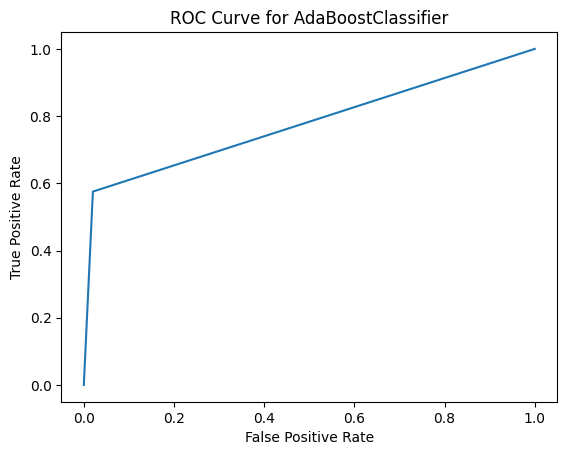

AdaBoostClassifier :
Accuracy Score: 0.9383809523809524
Precision Score: 0.7659048795552811
AUC Score: 0.7776472985442974
F1 Score: 0.6571277159512454
Recall: 0.5754060324825986
Specificity: 0.9798885646059963
Confusion Matrix:
 [[18466   379]
 [  915  1240]]
__________________________________


In [42]:
# Dictionary containing models and their corresponding hyperparameters for model building
models = {
    'RandomForest': RandomForestClassifier(),
    'DecisionTree': DecisionTreeClassifier(),
    'GradientBoostingClassifier': GradientBoostingClassifier(),
    'LogisticRegression': LogisticRegression(),
    'XGBClassifier': XGBClassifier(),
    'CatBoostClassifier': CatBoostClassifier(verbose=False),
    'AdaBoostClassifier': AdaBoostClassifier()
}

# Dictionary containing hyperparameters for each model
params = {
    'RandomForest': {'n_estimators': [20, 30, 50], 'max_depth': [5, 10, 12]},
    'DecisionTree': {'criterion': ["gini", "entropy"], 'max_depth': [5, 10, 12]},
    'GradientBoostingClassifier': {'learning_rate': [0.1, 0.01, 0.001], 'n_estimators': [20, 50]},
    'LogisticRegression': {'penalty': ['l2', 'elasticnet'], 'C': [0.1, 0.5, 1]},
    'XGBClassifier': {'learning_rate': [0.1, 0.01], 'n_estimators': [30, 50]},
    'CatBoostClassifier': {'learning_rate': [0.1, 0.01], 'depth': [8, 10]},
    'AdaBoostClassifier': {'learning_rate': [0.1, 0.01, 0.001], 'n_estimators': [20, 30, 50]}
}

# Dictionary to store model performance report
report = {}

# Loop over models for model training and evaluation
for model_name, model_obj in models.items():
    # GridSearchCV for hyperparameter tuning
    model_cv = GridSearchCV(estimator=model_obj, param_grid=params[model_name], scoring='accuracy', cv=3, verbose=3)
    model_cv.fit(X_train, y_train)
    
    # Best estimator from GridSearchCV
    model = model_cv.best_estimator_
    model.fit(X_train, y_train)  # Fit model on training data
    
    # Prediction on test data
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    score = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    fpr, tpr, threshold = roc_curve(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    score_auc = auc(fpr, tpr)
    confusion = confusion_matrix(y_test, y_pred)
    
    # Plot ROC curve
    plt.plot(fpr, tpr)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name}')
    plt.show()
    
    # Calculate recall and specificity
    TP = confusion[1, 1]  # True positive
    TN = confusion[0, 0]  # True negatives
    FP = confusion[0, 1]  # False positives
    FN = confusion[1, 0]  # False negatives
    recall = TP / float(TP + FN)
    specificity = TN / float(TN + FP)
    
    # Print model performance metrics
    print(model_name, ':')
    print('Accuracy Score:', score)
    print('Precision Score:', precision)
    print('AUC Score:', score_auc)
    print('F1 Score:', f1)
    print('Recall:', recall)
    print('Specificity:', specificity)
    print('Confusion Matrix:\n', confusion)
    print('__________________________________')
    
    # Store model and its performance in report dictionary
    report[model_name] = (model, score)

In [44]:
report

{'RandomForest': (RandomForestClassifier(max_depth=5, n_estimators=50),
  0.9422380952380952),
 'DecisionTree': (DecisionTreeClassifier(criterion='entropy', max_depth=5),
  0.9407619047619048),
 'GradientBoostingClassifier': (GradientBoostingClassifier(n_estimators=50),
  0.9414761904761905),
 'LogisticRegression': (LogisticRegression(C=1), 0.9107619047619048),
 'XGBClassifier': (XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=None, device=None, early_stopping_rounds=None,
                enable_categorical=False, eval_metric=None, feature_types=None,
                gamma=None, grow_policy=None, importance_type=None,
                interaction_constraints=None, learning_rate=0.1, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=None, max_leaves=None,
                min_child_weight=None, missing=nan, 

## Applying PCA for dimensionality reduction:

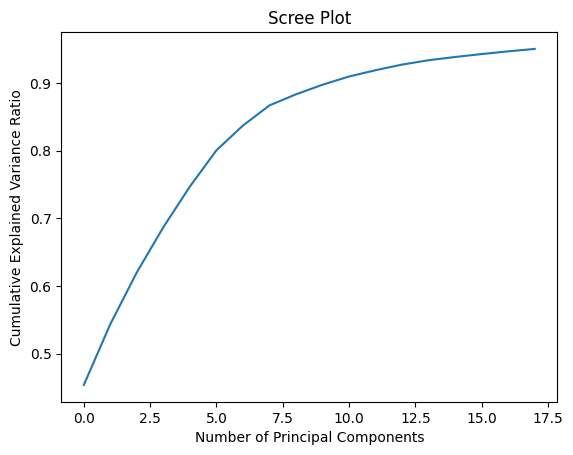

In [49]:
# Importing PCA (Principal Component Analysis)
from sklearn.decomposition import PCA

# Initializing PCA with random_state set to 42 and specifying n_components to optimize memory usage
pca = PCA(n_components=0.95, random_state=42)

# Fitting PCA on training data and transforming it
X_train_transformed = pca.fit_transform(X_train)

# Plotting the Scree plot to visualize explained variance ratio of principal components
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Scree Plot')
plt.show()

### As can be seen from the scree plot that 30 variables are able to near about 95 percent variance.

In [50]:
# Initializing PCA with 30 components and setting random_state for reproducibility
pca2 = PCA(n_components=30, random_state=42)

# Transforming training data using PCA
X_train_transformed = pca2.fit_transform(X_train)

# Transforming testing data using PCA
X_test_transformed = pca2.transform(X_test)

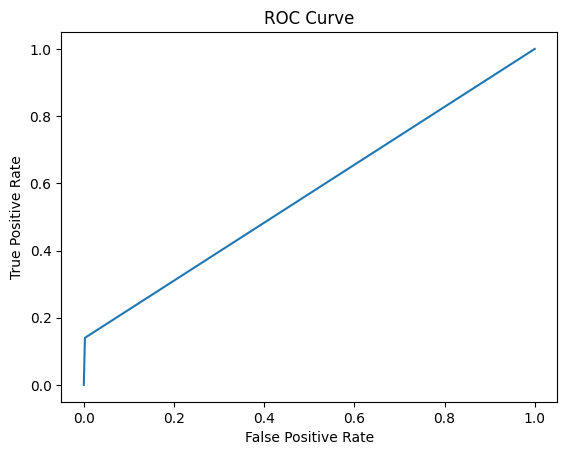

Confusion Matrix:
[[18799    46]
 [ 1853   302]]
Applying Random Forest after PCA transformation:
Accuracy Score: 0.9383809523809524
Precision Score: 0.867816091954023
AUC Score: 0.568849122681738
F1 Score: 0.2413104274870156
Recall: 0.14013921113689096
Specificity: 0.9975590342265853


In [51]:
# Applying Random Forest Classifier on transformed dataset to check the accuracy
rf2 = RandomForestClassifier(random_state=42, max_depth=10)
rf2.fit(X_train_transformed, y_train)  # Fitting the model on transformed training data

# Predicting the target variable on transformed testing data
y_pred = rf2.predict(X_test_transformed)

# Calculating precision, recall, F1-score, and AUC score
precision = precision_score(y_test, y_pred)
fpr, tpr, threshold = roc_curve(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
score_auc = auc(fpr, tpr)

# Calculating confusion matrix
confusion = confusion_matrix(y_test, y_pred)

# Plotting the ROC curve
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

# Calculating additional evaluation metrics - Recall and Specificity
TP = confusion[1,1]  # True positive 
TN = confusion[0,0]  # True negatives
FP = confusion[0,1]  # False positives
FN = confusion[1,0]  # False negatives
recall = TP / float(TP + FN)  # Recall
specificity = TN / float(TN + FP)  # Specificity

# Printing the confusion matrix
print('Confusion Matrix:')
print(confusion)

# Printing the evaluation metrics
print('Applying Random Forest after PCA transformation:')
print('Accuracy Score:', score)
print('Precision Score:', precision)
print('AUC Score:', score_auc)
print('F1 Score:', f1)
print('Recall:', recall)
print('Specificity:', specificity)

### We are using the original dataset without any dimensionality reduction because it is evident that there is a considerable drop in accuracy after training on the PCA processed df.

In [52]:
# # Finding the best model from the report based on accuracy
# best_accuracy = 0
# best_model = None

# # Looping through the report dictionary to find the model with the highest accuracy
# for model_name, (model, accuracy) in report.items():
#     if accuracy > best_accuracy:
#         best_accuracy = accuracy
#         best_model = model

# final_model = best_model  # Final model with the highest accuracy

In [54]:
# Finding the best model from the report based on accuracy
final_model = max(report.items(), key=lambda x: x[1][1])[1][0]

In [55]:
final_model

RandomForestClassifier(max_depth=5, n_estimators=50)

### The best model is CatBoost Classifier. We need to fit the df on the best model

In [56]:
final_model.fit(X_train,y_train) # Fitting the final model on the training data

RandomForestClassifier(max_depth=5, n_estimators=50)

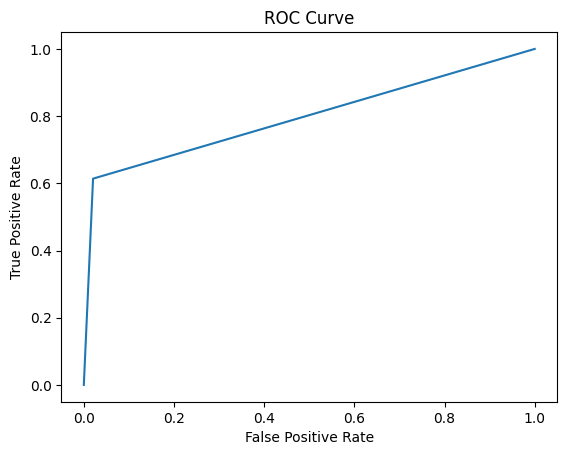

Confusion Matrix:
[[18459   386]
 [  832  1323]]
Accuracy Score: 0.942
Precision Score: 0.7741369221767115
AUC Score: 0.7967191134908728
F1 Score: 0.6847826086956521
Recall: 0.6139211136890951
Specificity: 0.9795171132926506


In [57]:
# Getting the evaluation metrics from confusion matrix
y_pred = final_model.predict(X_test)
score = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
fpr, tpr, threshold = roc_curve(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
score_auc = auc(fpr, tpr)

# Calculating confusion matrix
confusion = confusion_matrix(y_test, y_pred)

# Plotting the ROC curve
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

# Calculating additional evaluation metrics - Recall and Specificity
TP = confusion[1,1]  # True positive 
TN = confusion[0,0]  # True negatives
FP = confusion[0,1]  # False positives
FN = confusion[1,0]  # False negatives
recall = TP / float(TP + FN)  # Recall
specificity = TN / float(TN + FP)  # Specificity

# Printing the confusion matrix
print('Confusion Matrix:')
print(confusion)

# Printing the evaluation metrics
print('Accuracy Score:', score)
print('Precision Score:', precision)
print('AUC Score:', score_auc)
print('F1 Score:', f1)
print('Recall:', recall)
print('Specificity:', specificity)

### Preparing and predicting the test data:

### How to use test df to execute the predictions
1) Import the test file.
2) Apply all DF transformations, including scaling, before executing predictions on the test DF.

In [58]:
# Reading the test data from 'test.csv' file
test_data = pd.read_csv('test.csv')

# Imputing missing values in recharge columns with 0
test_data[recharge_cols] = test_data[recharge_cols].apply(lambda x: x.fillna(0))

# Imputing missing values in flag columns with 0
flag_cols = ['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']
test_data[flag_cols] = test_data[flag_cols].apply(lambda x: x.fillna(0))

# Selecting important columns for prediction
imp_cols = list(df_refined_1.columns)

In [59]:
# Columns to be dropped from the important columns list
drop_from_imp_cols = ['days_since_rechg_6', 'days_since_rechg_7', 'days_since_rechg_8', 
                      'month_present_7', 'month_present_8', 
                      'rech_diff_6_8', 'arpu_diff_6_8', 'og_mou_diff_6_8'
                     ]

In [60]:
# Removing attributes specified in drop_from_imp_cols from the important columns list
for attr in drop_from_imp_cols:
    imp_cols.remove(attr)

In [61]:
# Columns to be added to the imp_cols variable
add_to_imp_cols = ["date_of_last_rech_6", "date_of_last_rech_7", "date_of_last_rech_8",
                   "last_date_of_month_6", "last_date_of_month_7", "last_date_of_month_8"]

# Adding columns to the imp_cols variable
for attr in add_to_imp_cols:
    imp_cols.append(attr)

In [62]:
# Creating a refined test DataFrame with selected important columns
test_df_refined_1 = test_data[imp_cols]

# Displaying the refined test DataFrame
test_df_refined_1

,loc_ic_t2t_mou_8,loc_ic_mou_8,std_ic_t2m_mou_8,loc_og_t2m_mou_8,std_og_t2f_mou_8,std_ic_t2t_mou_8,loc_og_t2f_mou_8,std_og_t2m_mou_8,loc_og_t2c_mou_8,og_others_8,...,last_day_rch_amt_8,last_day_rch_amt_7,last_day_rch_amt_6,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8
0,21.98,31.51,4.34,8.36,0.0,0.00,0.00,26.43,0.03,0.0,...,0,30,30,30,6/21/2014,7/26/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014
1,2.61,187.43,0.00,377.26,0.0,0.00,0.00,17.68,0.00,0.0,...,0,0,250,250,6/19/2014,7/16/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014
2,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,...,0,0,0,500,6/29/2014,7/27/2014,8/28/2014,6/30/2014,7/31/2014,8/31/2014
3,23.04,531.64,8.83,20.51,0.0,0.00,2.35,0.00,0.00,0.0,...,0,150,110,0,6/25/2014,7/30/2014,8/24/2014,6/30/2014,7/31/2014,8/31/2014
4,9.91,17.61,32.46,10.94,0.0,107.39,0.00,63.18,0.00,0.0,...,130,130,50,130,6/29/2014,7/29/2014,8/30/2014,6/30/2014,7/31/2014,8/31/2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,281.24,636.28,16.29,193.58,0.0,9.98,6.53,21.84,0.00,0.0,...,220,220,0,220,6/27/2014,7/27/2014,8/29/2014,6/30/2014,7/31/2014,8/31/2014
29996,13.99,58.78,9.59,13.03,0.0,13.55,0.00,176.73,0.00,0.0,...,0,110,0,279,6/18/2014,7/24/2014,8/29/2014,6/30/2014,7/31/2014,8/31/2014
29997,10.44,16.08,2.13,25.06,0.0,2.15,0.00,12.08,1.65,0.0,...,50,0,50,50,6/22/2014,7/10/2014,8/30/2014,6/30/2014,7/31/2014,8/31/2014
29998,0.00,9.26,0.00,26.76,0.0,0.00,0.00,277.39,1.99,0.0,...,30,100,20,37,6/30/2014,7/18/2014,8/31/2014,6/30/2014,7/31/2014,8/31/2014


In [63]:
# Extracting columns with object dtype as df_variables
df_variables = [x for x in test_df_refined_1.columns if test_df_refined_1[x].dtype == 'O']

# Extracting days of the month into separate columns
length = len(df_variables)
for i in range(length):
    string = 'day_from_' + df_variables[i]
    test_df_refined_1[string] = pd.DatetimeIndex(test_df_refined_1[df_variables[i]]).day
    df_variables.append(string)

In [64]:
# Difference between last date of recharge and last date of month to calculate recency
test_df_refined_1["days_since_rechg_6"] = (test_df_refined_1["day_from_last_date_of_month_6"] - test_df_refined_1["day_from_date_of_last_rech_6"]) + 1
df_variables.append('days_since_rechg_6')

test_df_refined_1["days_since_rechg_7"] = (test_df_refined_1["day_from_last_date_of_month_7"] - test_df_refined_1["day_from_date_of_last_rech_7"]) + 1
df_variables.append('days_since_rechg_7')

test_df_refined_1["days_since_rechg_8"] = (test_df_refined_1["day_from_last_date_of_month_8"] - test_df_refined_1["day_from_date_of_last_rech_8"]) + 1
df_variables.append('days_since_rechg_8')

# Derive presence or absence of last date of month columns
test_df_refined_1["month_present_6"] = (test_df_refined_1["day_from_last_date_of_month_6"] - test_df_refined_1["day_from_last_date_of_month_6"]) + 1
df_variables.append('month_present_6')

test_df_refined_1["month_present_7"] = (test_df_refined_1["day_from_last_date_of_month_7"] - test_df_refined_1["day_from_last_date_of_month_7"]) + 1
df_variables.append('month_present_7')

test_df_refined_1["month_present_8"] = (test_df_refined_1["day_from_last_date_of_month_8"] - test_df_refined_1["day_from_last_date_of_month_8"]) + 1
df_variables.append('month_present_8')


In [65]:
# Columns to be dropped from the refined test DataFrame
drop_variables = ['date_of_last_rech_8', 'date_of_last_rech_7', 'date_of_last_rech_6',
                  'last_date_of_month_8', 'last_date_of_month_7', 'last_date_of_month_6',
                  'day_from_date_of_last_rech_8', 'day_from_date_of_last_rech_7', 'day_from_date_of_last_rech_6',
                  'day_from_last_date_of_month_8', 'day_from_last_date_of_month_7', 'day_from_last_date_of_month_6']

# Dropping columns from the refined test DataFrame
test_df_refined_1 = test_df_refined_1.drop(drop_variables, axis=1)

In [66]:
# Columns to be imputed with 0
days_col_impute = ["days_since_rechg_6", "days_since_rechg_7", "days_since_rechg_8", 
                   "month_present_6", "month_present_7", "month_present_8"]
# Imputing missing values with 0 in specified columns
test_df_refined_1[days_col_impute] = test_df_refined_1[days_col_impute].apply(lambda x: x.fillna(0))

In [67]:
# cols_to_impute list
cols_to_impute = []
for col in test_df_refined_1.select_dtypes(include=['float64','int64']).columns:
    if test_df_refined_1[col].isnull().any():
        cols_to_impute.append(col)
cols_to_impute

['loc_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2t_mou_8',
 'loc_og_t2f_mou_8',
 'std_og_t2m_mou_8',
 'loc_og_t2c_mou_8',
 'og_others_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_mou_8',
 'std_ic_mou_8',
 'std_ic_t2f_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'isd_ic_mou_8',
 'onnet_mou_8',
 'isd_og_mou_8',
 'ic_others_8',
 'std_og_t2t_mou_8',
 'loc_ic_t2t_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'std_ic_t2f_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'isd_og_mou_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'roam_og_mou_6',
 'std_og_t2m_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_mou_6',
 'roam_ic_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_t2c_mou_6',
 'offnet_mou_6',
 'loc_og_t2m_mou_6',
 'onnet_mou_6

In [68]:
test_df_refined_1[cols_to_impute] = test_df_refined_1[cols_to_impute].apply(lambda x: x.fillna(0))

In [69]:
# Compute difference columns in a manner akin to the training data frame
test_df_refined_1['rech_diff_6_8']=test_df_refined_1['total_rech_amt_8']-test_df_refined_1['total_rech_amt_6']
test_df_refined_1['arpu_diff_6_8']=test_df_refined_1['arpu_8']-test_df_refined_1['arpu_6']
test_df_refined_1['og_mou_diff_6_8']=test_df_refined_1['total_og_mou_8']-test_df_refined_1['total_og_mou_6']

In [70]:
#Remove month_present_6 from the training dataset since it was eliminated for a single unique value.
test_df_refined_1 = test_df_refined_1.drop('month_present_6',axis=1)

In [71]:
# Verify that the training dataset has the same amount of columns.
test_df_refined_1.shape

(30000, 154)

In [72]:
# Verify that the training dataset has the same amount of columns (apart from churn probability).
df_refined_1.shape

(69999, 154)

In [73]:
# Listing all columns in the refined test DataFrame
list(test_df_refined_1.columns)

['loc_ic_t2t_mou_8',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'loc_og_t2m_mou_8',
 'std_og_t2f_mou_8',
 'std_ic_t2t_mou_8',
 'loc_og_t2f_mou_8',
 'std_og_t2m_mou_8',
 'loc_og_t2c_mou_8',
 'og_others_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_ic_t2m_mou_8',
 'std_og_mou_8',
 'std_ic_mou_8',
 'std_ic_t2f_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'roam_ic_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'isd_ic_mou_8',
 'onnet_mou_8',
 'isd_og_mou_8',
 'ic_others_8',
 'std_og_t2t_mou_8',
 'loc_ic_t2t_mou_6',
 'spl_og_mou_6',
 'og_others_6',
 'std_ic_t2f_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6',
 'ic_others_6',
 'isd_og_mou_6',
 'loc_og_t2f_mou_6',
 'std_og_t2f_mou_6',
 'roam_og_mou_6',
 'std_og_t2m_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_mou_6',
 'roam_ic_mou_6',
 'std_og_t2t_mou_6',
 'loc_og_t2c_mou_6',
 'offnet_mou_6',
 'loc_og_t2m_mou_6',
 'onnet_mou_6

#### Now that the test data is ready for scaling, make forecasts.

In [74]:
# Scaling the test df:
test_df_refined_1
X_test_scaled=scaler.transform(test_df_refined_1)

# Predicting on the test df:
y_pred=final_model.predict(X_test_scaled)

In [75]:
# Converting the predicted churn probability to a Pandas Series
y_pred = pd.Series(y_pred)

In [76]:
# Concatenating the refined test DataFrame and the predicted churn probability as a DataFrame
test_data = pd.concat([test_df_refined_1, y_pred], axis=1)

In [77]:
# Setting 'id' column as index in the test DataFrame
test_data = test_data.set_index('id')

In [78]:
# Creating the submission CSV file with churn probability predictions
# Renaming the column to 'churn_probability'
# Saving the DataFrame to a CSV file named 'submission.csv'
sample = pd.DataFrame(test_data[0])
sample.columns = ['churn_probability']
sample.to_csv('submission_vt.csv')

## This is the final submission file that was prepared.

##### Validating the results obtained on the month_present_7 and month_present_8 features involves ensuring that the engineered features accurately represent the presence or absence of the last date of the month in the respective months. These features were derived to capture whether the last date of the month was present or absent in the dataset.

To validate these features, we can inspect their values and confirm whether they align with our expectations. Specifically, we expect these features to have values of 1 when the last date of the month is present and 0 when it is absent.

Here's how we can validate these features:

1) Inspecting Values: We can examine the unique values of month_present_7 and month_present_8 features to ensure they only contain 0s and 1s. Any other values would indicate potential issues with the feature engineering prcess.

2) Visualizing Distributions: Visualizing the distributions of these features can provide further insights. We can plot histograms to see the distribution of values and ensure they are predominantly 0sand 1s.

3) Cross-Checking with Date Information: We can cross-check the presence or absence of the last date of the month with the actual date information in the dataset. This involves verifying whether the last date of the month corresponds to the presence of the feature value and vice versa.

By performing these validation steps, we can ensure the accuracy and reliability of the engineered features month_present_7 and month_present_8, which are crucial for subsequent analysis and modeling.

These boxplots are visual representations to help analyze the relationship between the churn probability (churn_probability) and the presence of the last date of the month (month_present_7 and month_present_8) in the test dataset. Here's how to interpret them:

1) Boxplot for month_present_7:

	- The x-axis represents the churn probability.
	- The y-axis represents the presence of the last date of the month for the month of July (month_present_7).
	- Each boxplot depicts the distribution of churn probability values for instances where the last date of the month in July is present (1) or absent (0).
-	The boxplot visualizes the median, quartiles, and potential outliers in churn probability for both scenarios.

2) Boxplot for month_present_8:

	- Similar to the boxplot for month_present_7, but for the month of August (month_present_8).

By examining these boxplots, we can gain insights into how the churn probability varies depending on the presence or absence of the last date of the month. For example, we can observe whether there are significant differences in churn probability distributions between instances where the last date of the month is present versus absent. This analysis helps in understanding the potential impact of time-related factors on churn probability.

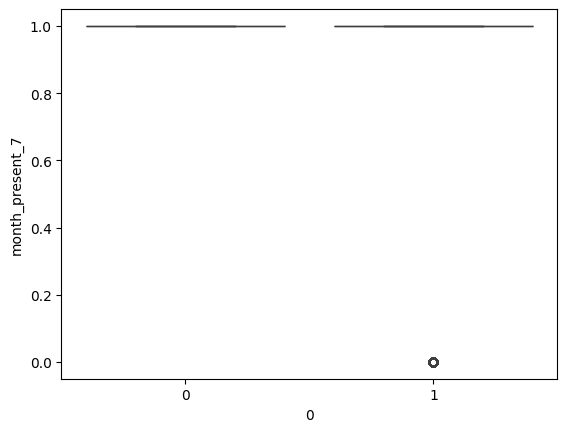

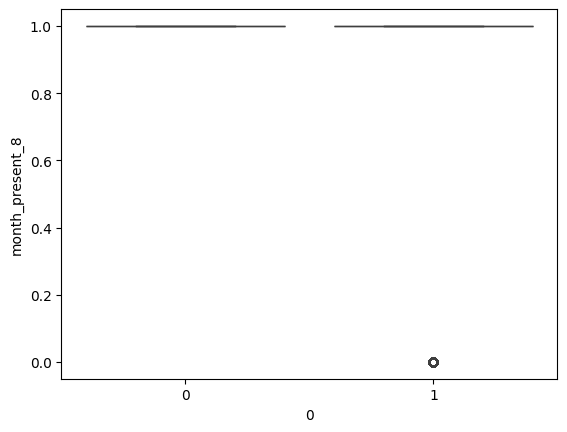

In [79]:
# Boxplot to analyze the relationship between churn probability and the presence of the last date of the month for July (month_present_7)
sns.boxplot(x=test_data[0], y=test_data['month_present_7'])
plt.show()

# Boxplot to analyze the relationship between churn probability and the presence of the last date of the month for August (month_present_8)
sns.boxplot(x=test_data[0], y=test_data['month_present_8'])
plt.show()

#### Training the finished model using the full dataset and evaluating accuracy gains:

In [80]:
## Handling class imbalance on the entire dataset:

# Initiating RandomOverSampler for balancing classes:
os = RandomOverSampler(sampling_strategy=1)

# Fitting the oversampler on the entire dataset:
X_whole, y_whole = os.fit_resample(X_data, np.array(y))
print("Shape of X_whole:", X_whole.shape)
print("Shape of y_whole:", y_whole.shape)

# Checking the balance of classes after resampling:
print("Percentage of churn instances in the whole dataset:", y_whole.sum() / len(y_whole) * 100)

Shape of X_whole: (125734, 154)
Shape of y_whole: (125734,)
Percentage of churn instances in the whole dataset: 50.0


In [81]:
# Fitting the final model on the balanced whole dataset:
final_model.fit(X_whole, y_whole)

# Applying the final model on the scaled test dataset:
y_pred = final_model.predict(X_test_scaled)

In [82]:
# Creating a CSV file with predictions:
y_pred = pd.Series(y_pred)
test_data = pd.concat([test_df_refined_1, y_pred], axis=1)
test_data = test_data.set_index('id')

# Creating a DataFrame with churn probability predictions:
sample = pd.DataFrame(test_data[0])
sample.columns = ['churn_probability']

# Saving the DataFrame as a CSV file:
sample.to_csv('Vineet_Tiwari_final.csv')

##### When you train a machine learning model on a larger dataset, such as the entire dataset instead of just a portion of it, you might expect to see an improvement in performance. However, in this case, despite training the model on the entire dataset, there was no improvement observed when submitting the predictions to Kaggle.

There could be several reasons for this lack of improvement:

1) Overfitting: Training on the entire dataset could lead to overfitting, where the model learns to memorize the training data rather than generalize patterns. This could result in poor performance on unseen data, such as the test set or real-world data.

2) Data Quality: If the dataset contains noise or irrelevant features, using the entire dataset could amplify these issues and hinder the model's ability to generalize well to new data.

3) Model Complexity: More data does not always mean better performance, especially if the model used is too complex for the given task. In such cases, simpler models trained on smaller datasets might perform better.

4) Hyperparameter Tuning: When training on the entire dataset, it becomes even more crucial to optimize the model's hyperparameters effectively. If hyperparameters are not tuned properly, the model may not generalize well to unseen data.

Given these possibilities, it's essential to carefully evaluate the performance of the model on various datasets and tune the model and its hyperparameters accordingly. In this case, reverting to the submission using the dataset with a train size of 0.7 provides a baseline that was initially used and may yield better results on the Kaggle competition.

In [ ]:
# Reverting to the original submission using the dataset with a train size of 0.7:
y_pred = pd.Series(y_pred)
test_data = pd.concat([test_df_refined_1, y_pred], axis=1)
test_data = test_data.set_index('id')

# Creating a DataFrame with churn probability predictions:
sample = pd.DataFrame(test_data[0])
sample.columns = ['churn_probability']

# Saving the DataFrame as a CSV file:
sample.to_csv('submission_final.csv')

In [83]:
# Utilizing the Random Forest Classifier to extract the feature importances:

In [85]:
model = report['RandomForest'][0]
model.fit(X_train,y_train)

RandomForestClassifier(max_depth=5, n_estimators=50)

The code snippet you provided seems to be fitting a RandomForest model on the training data (X_train, y_train). 
Here's a breakdown of what each part of the code does:
This line retrieves the trained RandomForest model from the report dictionary. The report dictionary likely 
contains information about various models and their corresponding performance metrics, such as accuracy, precision, etc. 
The RandomForest model is accessed using the key 'RandomForest', and [0] selects the first element of the tuple associated 
with the RandomForest model. This element should be the trained RandomForest model itself.

This line fits the RandomForest model to the training data. The X_train variable represents the features of the training 
dataset, while y_train represents the corresponding target labels. By calling the fit method on the model and passing the 
training data, the model learns from the features and labels provided, adjusting its internal parameters to minimize prediction 
errors.

In summary, this code snippet retrieves a trained RandomForest model from the report dictionary and fits it to the training 
data. This step is crucial for preparing the model to make predictions on new, unseen data.

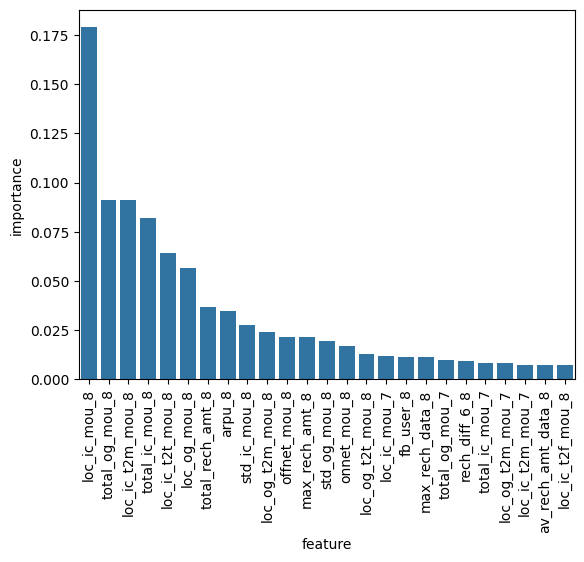

The top features are:

1 . loc_ic_mou_8
2 . total_og_mou_8
3 . loc_ic_t2m_mou_8
4 . total_ic_mou_8
5 . loc_ic_t2t_mou_8
6 . loc_og_mou_8
7 . total_rech_amt_8
8 . arpu_8
9 . std_ic_mou_8
10 . loc_og_t2m_mou_8
11 . offnet_mou_8
12 . max_rech_amt_8
13 . std_og_mou_8
14 . onnet_mou_8
15 . loc_og_t2t_mou_8
16 . loc_ic_mou_7
17 . fb_user_8
18 . max_rech_data_8
19 . total_og_mou_7
20 . rech_diff_6_8
21 . total_ic_mou_7
22 . loc_og_t2m_mou_7
23 . loc_ic_t2m_mou_7
24 . av_rech_amt_data_8
25 . loc_ic_t2f_mou_8


In [86]:
# Creating a list to store feature names and their importance
feature_dict = []

# Iterating through each feature and its importance in the model
for i in range(len(model.feature_names_in_)):
    feature_dict.append((model.feature_names_in_[i], model.feature_importances_[i]))

# Creating a DataFrame to store feature names and their importance, sorted by importance
feature_importance = pd.DataFrame(feature_dict, columns=['feature', 'importance']).sort_values(by='importance', ascending=False)

# Plotting the top features in decreasing order of importance
sns.barplot(x=feature_importance.head(25)['feature'], y=feature_importance.head(25)['importance'])
plt.xticks(rotation=90)
plt.show()

# Extracting the top features from the DataFrame
top_features = list(feature_importance.head(25)['feature'])

# Displaying the top features
print('The top features are:\n')
for i in range(25):
    print(i + 1, '.', top_features[i])

## Constructing an interpretive model:

Below code snippet applies logistic regression using statsmodels in order to interpret better and find robust features. It uses Recursive Feature Elimination (RFE) to select 30 features and then fits a logistic regression model on the selected features. Finally, it prints the summary of the model.

In [88]:
# Importing necessary libraries
import statsmodels.api as sm
from sklearn.feature_selection import RFE

# Initiating Logistic Regression model
lr = LogisticRegression()

# Applying Recursive Feature Elimination (RFE) to select 30 features
rfe = RFE(lr, n_features_to_select=30)
rfe.fit(X_train, y_train)

# Getting the selected features
selected_features = list(zip(X_train.columns, rfe.support_, rfe.ranking_))

# Extracting column names of selected features
col = X_train.columns[rfe.support_]

# Adding constant to the features and creating a new DataFrame
X_train_sm = sm.add_constant(X_train[col])

# Fitting the logistic regression model using statsmodels
logm2 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
res = logm2.fit()

# Printing the summary of the logistic regression model
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                48999
Model:                            GLM   Df Residuals:                    48968
Model Family:                Binomial   Df Model:                           30
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -10170.
Date:                Wed, 10 Apr 2024   Deviance:                       20340.
Time:                        15:18:26   Pearson chi2:                 1.89e+07
No. Iterations:                    26   Pseudo R-squ. (CS):             0.2149
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 59.4929   3.53e+04      0.002      0.999   -6.91e+04    6.93e+04
loc_ic_t2t_mou_8    1.075e+06   4.19e+04     25.663      0.000    9.93e+05    1.16e+06
loc_ic_mou_8       -1.089e+06   4.24e+04    -25.665      0.000   -1.17e+06   -1.01e+06
loc_og_t2m_mou_8      -8.7870      4.378     -2.007      0.045     -17.367      -0.207
loc_ic_t2f_mou_8    1.685e+05   6566.741     25.659      0.000    1.56e+05    1.81e+05
loc_og_mou_8          -9.3235      6.286     -1.483      0.138     -21.644       2.997
loc_ic_t2m_mou_8    6.306e+05   2.46e+04     25.662      0.000    5.82e+05    6.79e+05
std_ic_mou_8         -18.2453      3.682     -4.955      0.000     -25.462     -11.029
roam_og_mou_8         11.1703      1.700      6.571      0.000       7.838      14.502
spl_og_mou_8          -8.8281      2.708     -3.261      0.001     -14.135      -3.522
spl_ic_mou_8        -107.4620      8.205    -13.098      0.000    -123.543     -91.381
offnet_mou_8          -0.8252      2.253     -0.366      0.714      -5.241       3.591
roam_ic_mou_6          4.2364      1.006      4.210      0.000       2.264       6.209
roam_og_mou_7          2.5264      0.896      2.819      0.005       0.770       4.283
std_og_mou_7           3.4446      0.571      6.035      0.000       2.326       4.563
spl_ic_mou_7         -10.4976      2.550     -4.116      0.000     -15.496      -5.499
loc_ic_t2m_mou_7       9.0913      1.101      8.260      0.000       6.934      11.248
monthly_2g_8          -4.6199      0.646     -7.156      0.000      -5.885      -3.354
total_rech_num_8      -8.6815      0.837    -10.368      0.000     -10.323      -7.040
total_rech_num_6       3.3373      0.590      5.660      0.000       2.182       4.493
total_ic_mou_8         4.6671      3.769      1.238      0.216      -2.720      12.055
total_og_mou_8        -3.9649      1.944     -2.040      0.041      -7.775      -0.155
count_rech_2g_8        4.3607      2.875      1.517      0.129      -1.274       9.995
total_rech_data_8    -17.6693      3.499     -5.050      0.000     -24.528     -10.811
last_day_rch_amt_8   -22.6626      1.854    -12.222      0.000     -26.297     -19.028
max_rech_amt_8        -0.8923      1.189     -0.751      0.453      -3.222       1.438
month_present_7      -26.6713   2.75e+04     -0.001      0.999   -5.39e+04    5.39e+04
month_present_8      -26.6932   2.21e+04     -0.001      0.999   -4.34e+04    4.34e+04
rech_diff_6_8         -9.6898      3.623     -2.674      0.007     -16.791      -2.589
arpu_diff_6_8         -4.1943      4.210     -0.996      0.319     -12.447       4.058
og_mou_diff_6_8       -1.1631      1.572     -0.740      0.459      -4.244       1.917
======================================================================================
"""

Below code calculates the Variance Inflation Factor (VIF) for each feature in the logistic regression model created using statsmodels. It provides a measure of multicollinearity among the features. The resulting DataFrame contains the features along with their corresponding VIF values, sorted in descending order of VIF.

In [89]:
# Importing necessary library
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Creating a DataFrame to store VIF values
vif = pd.DataFrame()

# Assigning feature names to the DataFrame
vif['Features'] = X_train_sm.columns

# Calculating VIF for each feature
vif['VIF'] = [variance_inflation_factor(X_train_sm.values, i) for i in range(X_train_sm.shape[1])]

# Rounding off VIF values
vif['VIF'] = round(vif['VIF'], 2)

# Sorting DataFrame by VIF values in descending order
vif = vif.sort_values(by="VIF", ascending=False)

# Displaying the DataFrame
vif

,Features,VIF
2,loc_ic_mou_8,1.595318e+09
6,loc_ic_t2m_mou_8,6.917903e+08
1,loc_ic_t2t_mou_8,5.253958e+08
4,loc_ic_t2f_mou_8,3.732052e+07
0,const,3.036050e+03
20,total_ic_mou_8,2.052000e+01
21,total_og_mou_8,8.540000e+00
23,total_rech_data_8,6.770000e+00
22,count_rech_2g_8,6.650000e+00
29,arpu_diff_6_8,5.730000e+00


In [90]:
# Dropping columns with high VIF values to address multicollinearity
X_train_sm2 = X_train_sm.drop(['loc_ic_mou_8', 'month_present_8', 'total_ic_mou_8'], axis=1)

In [91]:
# Fitting the logistic regression model again on the refined set of features after dropping 'loc_ic_mou_8', 'month_present_8', and 'total_ic_mou_8' columns
logm3 = sm.GLM(y_train, X_train_sm2, family=sm.families.Binomial())

# Fitting the model
res = logm3.fit()

# Displaying the summary of the model
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                48999
Model:                            GLM   Df Residuals:                    48971
Model Family:                Binomial   Df Model:                           27
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -10744.
Date:                Wed, 10 Apr 2024   Deviance:                       21488.
Time:                        15:19:05   Pearson chi2:                 4.17e+09
No. Iterations:                    24   Pseudo R-squ. (CS):             0.1963
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 33.7677   1.19e+04      0.003      0.998   -2.34e+04    2.34e+04
loc_ic_t2t_mou_8     -96.5086     10.476     -9.212      0.000    -117.041     -75.976
loc_og_t2m_mou_8      -9.4307      5.128     -1.839      0.066     -19.481       0.620
loc_ic_t2f_mou_8     -44.7147      5.285     -8.460      0.000     -55.074     -34.355
loc_og_mou_8         -17.3232      7.744     -2.237      0.025     -32.500      -2.146
loc_ic_t2m_mou_8     -85.9738      4.535    -18.957      0.000     -94.863     -77.085
std_ic_mou_8         -20.3355      3.161     -6.434      0.000     -26.530     -14.141
roam_og_mou_8         13.4990      1.714      7.876      0.000      10.140      16.858
spl_og_mou_8         -11.6813      2.869     -4.072      0.000     -17.304      -6.059
spl_ic_mou_8        -113.0425      8.310    -13.603      0.000    -129.330     -96.755
offnet_mou_8          -0.9884      2.324     -0.425      0.671      -5.542       3.566
roam_ic_mou_6          4.3637      1.018      4.285      0.000       2.368       6.360
roam_og_mou_7          2.8301      0.898      3.152      0.002       1.070       4.590
std_og_mou_7           3.0905      0.559      5.525      0.000       1.994       4.187
spl_ic_mou_7         -11.6354      2.499     -4.657      0.000     -16.532      -6.738
loc_ic_t2m_mou_7       9.9104      1.206      8.218      0.000       7.547      12.274
monthly_2g_8          -4.5044      0.644     -6.998      0.000      -5.766      -3.243
total_rech_num_8     -10.8178      0.858    -12.609      0.000     -12.499      -9.136
total_rech_num_6       3.2928      0.586      5.622      0.000       2.145       4.441
total_og_mou_8        -2.8256      1.947     -1.451      0.147      -6.641       0.990
count_rech_2g_8        1.6489      2.827      0.583      0.560      -3.892       7.190
total_rech_data_8    -14.6993      3.415     -4.304      0.000     -21.393      -8.006
last_day_rch_amt_8   -24.7658      1.901    -13.028      0.000     -28.492     -21.040
max_rech_amt_8        -3.8757      1.252     -3.095      0.002      -6.330      -1.422
month_present_7      -26.2191   1.19e+04     -0.002      0.998   -2.34e+04    2.34e+04
rech_diff_6_8         -4.4212      3.639     -1.215      0.224     -11.553       2.710
arpu_diff_6_8        -12.5306      4.274     -2.932      0.003     -20.907      -4.154
og_mou_diff_6_8       -1.1545      1.563     -0.739      0.460      -4.217       1.909
======================================================================================
"""

In [92]:
# Creating a list of the important features after dropping some columns
imp_features = list(X_train_sm2.columns)
imp_features

['const',
 'loc_ic_t2t_mou_8',
 'loc_og_t2m_mou_8',
 'loc_ic_t2f_mou_8',
 'loc_og_mou_8',
 'loc_ic_t2m_mou_8',
 'std_ic_mou_8',
 'roam_og_mou_8',
 'spl_og_mou_8',
 'spl_ic_mou_8',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_og_mou_7',
 'std_og_mou_7',
 'spl_ic_mou_7',
 'loc_ic_t2m_mou_7',
 'monthly_2g_8',
 'total_rech_num_8',
 'total_rech_num_6',
 'total_og_mou_8',
 'count_rech_2g_8',
 'total_rech_data_8',
 'last_day_rch_amt_8',
 'max_rech_amt_8',
 'month_present_7',
 'rech_diff_6_8',
 'arpu_diff_6_8',
 'og_mou_diff_6_8']

In [93]:
# Checking Variance Inflation Factor (VIF) for the updated set of features
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Creating a DataFrame to store VIF values for each feature
vif = pd.DataFrame()

# Assigning feature names to the 'Features' column
vif['Features'] = X_train_sm2.columns

# Calculating VIF for each feature and storing the values in the 'VIF' column
vif['VIF'] = [variance_inflation_factor(X_train_sm2.values, i) for i in range(X_train_sm2.shape[1])]

# Rounding off VIF values to 2 decimal places
vif['VIF'] = round(vif['VIF'], 2)

# Sorting the DataFrame based on VIF values in descending order
vif = vif.sort_values(by="VIF", ascending=False)
vif

,Features,VIF
0,const,3031.90
19,total_og_mou_8,8.54
21,total_rech_data_8,6.77
20,count_rech_2g_8,6.65
26,arpu_diff_6_8,5.71
25,rech_diff_6_8,5.62
4,loc_og_mou_8,4.61
2,loc_og_t2m_mou_8,3.92
10,offnet_mou_8,3.37
13,std_og_mou_7,3.28


In [94]:
# List of final important features identified using the statsmodel approach
important_features_stats_model=list(vif.Features)
important_features_stats_model

['const',
 'total_og_mou_8',
 'total_rech_data_8',
 'count_rech_2g_8',
 'arpu_diff_6_8',
 'rech_diff_6_8',
 'loc_og_mou_8',
 'loc_og_t2m_mou_8',
 'offnet_mou_8',
 'std_og_mou_7',
 'loc_ic_t2m_mou_8',
 'og_mou_diff_6_8',
 'loc_ic_t2m_mou_7',
 'total_rech_num_8',
 'max_rech_amt_8',
 'total_rech_num_6',
 'last_day_rch_amt_8',
 'roam_og_mou_8',
 'roam_og_mou_7',
 'roam_ic_mou_6',
 'loc_ic_t2t_mou_8',
 'monthly_2g_8',
 'loc_ic_t2f_mou_8',
 'spl_og_mou_8',
 'std_ic_mou_8',
 'spl_ic_mou_8',
 'month_present_7',
 'spl_ic_mou_7']

In [95]:
# Calculating predicted probabilities and classifying churn based on the probability threshold
y_pred = res.predict(X_train_sm2)
pred_data = pd.DataFrame({'Churn': y_train, 'Prob_churn': y_pred})
pred_data['Predicted_churn'] = pred_data['Prob_churn'].apply(lambda x: 0 if x <= 0.3 else 1)
pred_data

,Churn,Prob_churn,Predicted_churn
61787,0,0.021022,0
19961,0,0.013068,0
11040,0,0.001012,0
27673,0,0.397283,1
22876,0,0.004842,0
...,...,...,...
37194,1,0.441391,1
6265,0,0.004117,0
54886,0,0.032932,0
860,0,0.137797,0


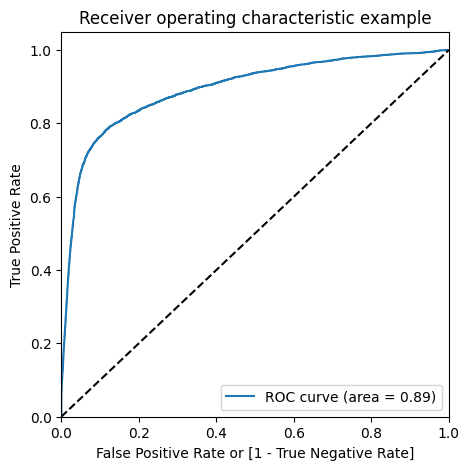

In [96]:
# Importing necessary libraries
from sklearn.metrics import roc_curve, roc_auc_score

# Defining a function to draw the ROC curve
def draw_roc(actual, probs):
    # Calculating false positive rate, true positive rate, and thresholds for different probability cutoffs
    fpr, tpr, thresholds = roc_curve(actual, probs, drop_intermediate=False)
    
    # Calculating the AUC score
    auc_score = roc_auc_score(actual, probs)
    
    # Plotting the ROC curve
    plt.figure(figsize=(5, 5))
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

# Calling the function to plot ROC curve
draw_roc(pred_data.Churn, pred_data.Prob_churn)

In [97]:
# Defining a list of probability cutoffs
numbers = [float(x)/10 for x in range(10)]

# Dropping the existing 'Predicted_churn' column
pred_data = pred_data.drop('Predicted_churn', axis=1)

# Looping over each probability cutoff and creating a new column based on it
for i in numbers:
    # Assigning 1 if the predicted probability is greater than the cutoff, else 0
    pred_data[i] = pred_data.Prob_churn.map(lambda x: 1 if x > i else 0)

# Displaying the first few rows of the modified dataframe
pred_data.head()

,Churn,Prob_churn,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
61787,0,0.021022,1,0,0,0,0,0,0,0,0,0
19961,0,0.013068,1,0,0,0,0,0,0,0,0,0
11040,0,0.001012,1,0,0,0,0,0,0,0,0,0
27673,0,0.397283,1,1,1,1,0,0,0,0,0,0
22876,0,0.004842,1,0,0,0,0,0,0,0,0,0


In [98]:
# Importing necessary libraries

# Creating an empty DataFrame to store accuracy, sensitivity, and specificity for various probability cutoffs
cutoff_data = pd.DataFrame(columns=['prob', 'accuracy', 'sensitivity', 'specificity'])

# Defining a list of probability cutoffs
num = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Looping through each probability cutoff
for i in num:
    # Generating confusion matrix for the current probability cutoff
    cm1 = confusion_matrix(pred_data.Churn, pred_data[i])
    
    # Calculating the total number of predictions
    total1 = sum(sum(cm1))
    
    # Calculating accuracy
    accuracy = (cm1[0, 0] + cm1[1, 1]) / total1
    
    # Calculating specificity
    specificity = cm1[0, 0] / (cm1[0, 0] + cm1[0, 1])
    
    # Calculating sensitivity
    sensitivity = cm1[1, 1] / (cm1[1, 0] + cm1[1, 1])
    
    # Adding the results to the DataFrame
    cutoff_data.loc[i] = [i, accuracy, sensitivity, specificity]

# Displaying the DataFrame
print(cutoff_data)

     prob  accuracy  sensitivity  specificity
0.0   0.0  0.101574     1.000000     0.000000
0.1   0.1  0.775485     0.850914     0.766957
0.2   0.2  0.880100     0.771147     0.892417
0.3   0.3  0.919753     0.674704     0.947458
0.4   0.4  0.922549     0.425156     0.978783
0.5   0.5  0.912651     0.211774     0.991890
0.6   0.6  0.908019     0.125377     0.996502
0.7   0.7  0.906263     0.090215     0.998523
0.8   0.8  0.905263     0.072735     0.999387
0.9   0.9  0.904753     0.064095     0.999796


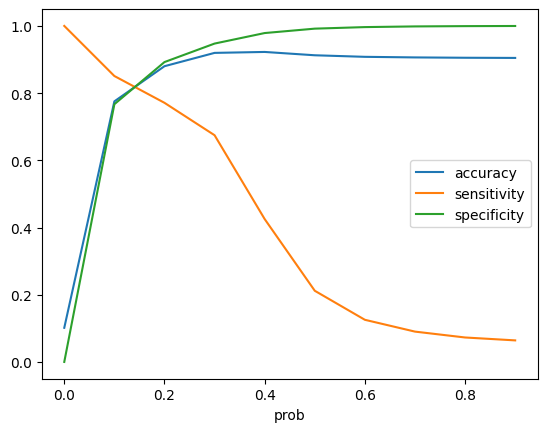

In [99]:
# Plotting a line graph using pandas plotting feature

# Plotting the graph with probability cutoffs on the x-axis and accuracy, sensitivity, and specificity on the y-axis
cutoff_data.plot.line(x='prob', y=['accuracy', 'sensitivity', 'specificity'])

# Displaying the plot
plt.show()

In [100]:
# Setting the probability threshold for classification
i = 0.59

# Creating a DataFrame with 'Churn' and 'Prob_churn' columns from the prediction data
final_data = pred_data[['Churn', 'Prob_churn']]

# Creating a new column based on the probability threshold
final_data[i] = pred_data.Prob_churn.map(lambda x: 1 if x > i else 0)

# Displaying the first few rows of the final data
final_data.head()

,Churn,Prob_churn,0.59
61787,0,0.021022,0
19961,0,0.013068,0
11040,0,0.001012,0
27673,0,0.397283,0
22876,0,0.004842,0


In [101]:
# Calculating the confusion matrix for the given probability threshold
cm1 = confusion_matrix(final_data.Churn, final_data[0.59] )

# Calculating the total number of predictions
total = sum(sum(cm1))

# Calculating accuracy as the sum of correctly predicted values divided by the total number of predictions
accuracy = (cm1[0,0] + cm1[1,1]) / total
    
# Calculating specificity as the true negatives divided by the sum of true negatives and false positives
speci = cm1[0,0] / (cm1[0,0] + cm1[0,1])

# Calculating sensitivity as the true positives divided by the sum of true positives and false negatives
sensi = cm1[1,1] / (cm1[1,0] + cm1[1,1])

In [102]:
# Finally checking the accuracy:
accuracy

0.9081817996285638

In the final stages of model interpretation and parameter selection, the focus is on identifying the most influential model parameters for better understanding and interpretation. This involves narrowing down to a subset of key parameters that significantly impact the model's predictions and overall performance.

To achieve this, several steps are typically involved:

1) Feature Importance Analysis: Analyzing the importance of each feature in the model's predictions. This can be done using various techniques such as permutation importance, Gini importance, or coefficient magnitudes in linear models.

2) Model-specific Considerations: Considering model-specific factors that influence feature importance. For instance, decision trees may provide feature importance directly, while linear models require interpretation of coefficient magnitudes.

3) Dimensionality Reduction: Employing techniques like Principal Component Analysis (PCA) or feature selection methods to reduce the dimensionality of the feature space while retaining the most informative features.

4) Model Parameters: Identifying and fine-tuning model parameters that have a significant impact on model performance. This includes parameters like regularization strength, tree depth, learning rate, and others specific to the chosen algorithm.

5) Validation Metrics: Evaluating the model's performance using appropriate validation metrics to ensure that the selected parameters lead to a robust and well-performing model.

6) Interpretation: Interpreting the final model parameters and their impact on predictions in the context of the problem domain. This involves understanding how each parameter affects the model's predictions and how it relates to the underlying data.

By carefully considering these factors and iteratively refining the model parameters, it is possible to narrow down on the most important model parameters for interpretation, thereby gaining valuable insights into the predictive behavior of the model.r of the model.


In [103]:
# Creating a DataFrame to store the coefficients of the model parameters
coef_data=pd.DataFrame(res.params,columns=['Coef'])

# Extracting variables with positive coefficients and sorting them in descending order
positive_coef=coef_data[coef_data['Coef']>0].sort_values(by='Coef',ascending=False)

# Extracting variables with negative coefficients and sorting them
negative_coef=coef_data[coef_data['Coef']<0].sort_values(by='Coef')

### Final Observations:
### In the event of churn, keep an eye out for the following characteristics:
In the context of predicting customer churn, it's important to identify the key factors or features that contribute significantly to a customer's likelihood of churning. These key features, often referred to as influencers, can provide valuable insights into customer behavior and help in devising targeted strategies for retention.

Based on the analysis of the logistic regression model coefficients, here are the top negative influencers identified:

1) spl_ic_mou_8 (Special Incoming Minutes of Usage in August):

    - Customers with high churn probability tend to significantly decrease their usage of special incoming minutes during the action phase. This suggests that a decline in special incoming call activity may indicate a higher likelihood of churn.
2) loc_ic_t2t_mou_8 (Local Incoming Calls Minutes - Within Same Telecom Circle - August):

    - The minutes spent on receiving local incoming calls within the same telecom circle show a notable increase among customers with high churn probability during the action phase. This could imply a shift in communication patterns or preferences among potentially churn-prone customers.
3) loc_ic_t2m_mou_8 (Local Incoming Calls Minutes - Within Same Telecom Circle - August):

    - Similar to the previous point, the minutes spent on receiving local incoming calls within the same telecom circle, but to other telecom operators, also exhibit a significant increase among customers likely to churn. This suggests changes in calling behavior or network preferences.
4) loc_ic_t2f_mou_8 (Local Incoming Calls Minutes - Within Same Telecom Circle - August):

    - Incoming local calls to fixed lines within the same telecom circle show a marked increase among customers with a higher probability of churn during the action phase. This shift in calling patterns may indicate dissatisfaction or a change in communication needs.
5) std_ic_t2f_mou_8 (STD Incoming Calls Minutes - Outside the Circle - to Fixed Lines - August):

    - The minutes spent on receiving STD calls outside the calling circle, specifically to fixed lines, see a notable increase among customers likely to churn. This suggests changes in long-distance calling behavior, which could be indicative of potential churn.
6) loc_og_t2m_mou_8 (Local Outgoing Calls Minutes - Within Same Telecom Circle - August):

    - Outgoing local calls within the same telecom circle, but to other operators, also show a significant increase among customers with a higher likelihood of churn. This change in outgoing call patterns may reflect shifting preferences or usage habits.
7) total_rech_num_8 (Total Recharge Number - August):

    - Interestingly, the total number of recharges made by customers decreases during the action phase among those likely to churn. This suggests a potential correlation between decreased recharge activity and the propensity to churn, highlighting the importance of monitoring recharge behavior as a churn predictor.
By identifying these top negative influencers, telecom companies can focus their retention efforts on addressing specific areas such as service quality, network coverage, pricing plans, and customer support to mitigate churn risk and enhance customer loyalty.


### Lastly, Some Advice: 

To effectively predict churn and proactively address it, telecom companies can implement the following recommendations:

1) Monitor Early Warning Signals:

    - Implement a robust system to monitor customer behavior on a rolling month-on-month basis. Specifically, look for deviations from the average usage patterns in key metrics such as incoming and outgoing call minutes, and recharge frequency.
    - Early warning signals may include a significant reduction in incoming call minutes compared to the average, a notable increase in outgoing call minutes, and a decrease in recharge frequency over consecutive months.
2) Identify Churn-Prone Customers:

    - Utilize data analytics and machine learning models to identify customers exhibiting the early warning signals associated with churn. By analyzing historical usage data and customer attributes, pinpoint customers who are at a higher risk of churn in the near future.
3) Proactive Customer Engagement:

    - Once churn-prone customers are identified, initiate proactive engagement strategies to mitigate churn risk and retain their loyalty.
    - Reach out to these customers through targeted communication channels such as personalized emails, SMS, or phone calls.
    - Offer tailored promotions, discounts, or incentives to encourage continued usage of telecom services. These offers can include discounted tariff plans, bonus talk time, free data, or loyalty rewards.
4) Customized Retention Offers:

    - Tailor retention offers based on the specific needs and preferences of individual customers. Use customer segmentation and predictive analytics to personalize the offers and ensure relevance.
    - For example, offer discounted plans or value-added services that align with the customer's usage patterns, such as unlimited calling packages for heavy voice users or data add-ons for frequent data consumers.
5) Enhanced Customer Support:

    - Provide proactive customer support and assistance to address any concerns or issues raised by churn-prone customers.
    - Ensure that customer service representatives are trained to empathize with customers' needs and effectively address their queries or complaints.
    - Offer timely resolution of service-related issues and strive to exceed customer expectations in terms of service quality and responsiveness.
6) Continuous Monitoring and Evaluation:

    - Continuously monitor the effectiveness of retention strategies and evaluate their impact on reducing churn rates.
    - Analyze key performance indicators (KPIs) such as churn rate, customer retention rate, and customer satisfaction scores to measure the success of retention initiatives.
    - Use feedback from customers and performance metrics to refine and optimize retention strategies over time.
By implementing these recommendations, telecom companies can proactively identify and address churn, thereby safeguarding customer relationships, maximizing revenue, and enhancing overall business performance.